# Forecasting Model

In [1]:
%load_ext autoreload
%autoreload

#%autoreload
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("""<style>div.output_area{max-height:10000px;overflow:scroll;}</style>"""))

import pandas as pd
pd.set_option("display.max_rows",1000)
pd.set_option("display.max_columns",500)
pd.set_option('precision', 3)

from os.path import join
from os import listdir
from pandas import read_csv, read_excel, Series, DataFrame, to_numeric, read_parquet, to_datetime, read_pickle
from pandas import date_range, concat
from sklearn.externals import joblib
from sklearn import metrics

import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

import warnings
warnings.filterwarnings('ignore')

from pmdarima.arima import auto_arima

In [22]:
endDate = '2019-06-30'

# Forecasting Functions

In [2]:
import numpy as np
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [3]:
dateStart = "1/1/2013"
def getDates(dateStart, periods):
    dateInfo = [x.to_pydatetime().strftime("%b, %Y") for x in date_range(start=dateStart, periods=periods, freq='M')]
    return dateInfo

In [4]:
def getBestFit(df, m=12):
    stepwise_fit = auto_arima(df.value, start_p=1, start_q=1, max_p=3, max_q=3, m=m,
                              start_P=0, seasonal=True, d=1, D=1, trace=True,
                              error_action='ignore',  # don't want to know if an order does not work
                              suppress_warnings=True,  # don't want convergence warnings
                              stepwise=True)  # set to stepwise

    return stepwise_fit

In [5]:
def getSARIMAX(df, steps, order, seasonal_order):
    from statsmodels.tsa.statespace.sarimax import SARIMAX

    # 1,1,2 ARIMA Model
    model = SARIMAX(df.value, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False)
    fit_res = model.fit(disp=False)
    res = model.filter(fit_res.params)

    # Perform prediction and forecasting
    predict = res.get_prediction()
    forecast = res.get_forecast(steps)

    # Get central and CI values
    forecasts = {}
    for cl in [0.5, 0.9, 0.68, 0.95]:
        forecast_mean = forecast.predicted_mean
        forecast_cint = forecast.conf_int(alpha=1-cl)
        forecasts[cl] = [forecast_mean, forecast_cint]

    cl=0.9
    predict_mean = predict.predicted_mean
    predict_mean = predict_mean[2:]
    predict_cint = predict.conf_int(alpha=1-cl)
    predict_cint = predict_cint[2:]
    
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    from numpy import sqrt
    ytrue = df.value[2:]
    ypred = predict_mean
    mae  = mean_absolute_error(ytrue, ypred)
    rmse = sqrt(mean_squared_error(ytrue, ypred))
    

    return [predict_mean, predict_cint, forecasts, mae, rmse]

In [6]:
def getARIMA(df, steps, order):
    from statsmodels.tsa.arima_model import ARIMA
    from pandas import concat

    # 1,1,2 ARIMA Model
    model = ARIMA(df.value, order=order)
    res = model.fit(disp=False)
    
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    from numpy import sqrt, arange
    ytrue = len(res.resid)*[0]
    ypred = res.resid
    mae  = mean_absolute_error(ytrue, ypred)
    rmse = sqrt(mean_squared_error(ytrue, ypred))

    # Get central and CI values
    predict_mean = df["value"][2:] + res.resid[1:]
    cl = 0.9
    predict_cint = concat([Series(predict_mean - res.conf_int(alpha=1-cl).values[0][0]), 
                           Series(predict_mean + res.conf_int(alpha=1-cl).values[0][1])], axis=1)
    predict_cint.columns = ["lower value", "upper value"]

    forecasts = {}
    for cl in [0.5, 0.9, 0.68, 0.95]:
        fc1, se1, conf1 = res.forecast(steps, alpha=1-cl)
        forecast_index = arange(len(df.values), len(df.values)+steps)
        forecast_mean = Series(fc1)
        forecast_mean.index = forecast_index
        forecast_cint = DataFrame(conf1)
        forecast_cint.columns = ["lower value", "upper value"]
        forecast_cint.index = forecast_index
        forecasts[cl] = [forecast_mean, forecast_cint]
        
    return [predict_mean, predict_cint, forecasts, mae, rmse]

# Master Plotting Functions

In [23]:
def cutData(data, startYear):
    salesdata = data.copy()
    salesdata = salesdata[(salesdata.index <= to_datetime('2019-07-01')) & (salesdata.index >= to_datetime('{0}-01-01'.format(startYear)))]
    for colname in salesdata.columns:
        salesdata[colname] = salesdata[colname]/1000
    return salesdata

In [24]:
def plotSalesData(salesdata, startYear, size=(12,6)):
    if size is not None:
        f, axs = plt.subplots(len(salesdata.columns), 1, sharex=True, figsize=size)
    else:
        f, axs = plt.subplots(len(salesdata.columns), 1, sharex=True, figsize=(10,3*len(salesdata.columns)))

    for i, colname in enumerate(salesdata.columns):
        if len(salesdata.columns) == 1:
            ax1 = axs
        else:
            ax1 = axs[i]

        ## Monthly Values (Continuous)
        plotdata = salesdata[colname]
        color = 'C0'
        ax1 = plotdata.plot(ax=ax1, grid=True, style='-p', ms=7, color=color)
        ax1.set_ylabel("Monthly Units Sold [k]", color=color)
        ax1.set_xlabel("Date")
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.set_title("{0} Units Sold Between Jan {1} and May 2019".format(colname, startYear))

        ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

        plotdata = salesdata[colname].cumsum()
        color = 'C1'
        ax2.set_ylabel('Total {0} Units Sold'.format(colname), color=color)  # we already handled the x-label with ax1
        ax2 = plotdata.plot(ax=ax2, style='-p', ms=7, color=color)
        ax2.tick_params(axis='y', labelcolor=color)

        f.tight_layout()  # otherwise the right y-label is slightly clipped

In [25]:
def fitSalesData(salesdata, size=(12,6)):
    fitresults = {}
    for colname in salesdata.columns:
        fitdata = DataFrame(salesdata[colname])
        fitdata.columns = ["value"]
        fitresults[colname] = {"Result": getBestFit(fitdata, m=12), "Data": fitdata}

    fullresults = plotForecasts(fitresults, size)
    return fullresults

In [26]:
def plotForecasts(fitresults, size=(12,6)):
    fullresults = {}
    for colname, results in fitresults.items():
        result  = results["Result"]
        fitdata = results["Data"]
        order  = result.order
        seasonal_order = result.seasonal_order
        sxresult = getSARIMAX(fitdata, steps=43, order=order, seasonal_order=seasonal_order)

        predict_mean, predict_cint, forecasts, mae, rmse = sxresult
        pcasts = predict_mean.append(forecasts[0.9][0])
        fcasts = predict_cint.append(forecasts[0.9][1])
        fdata = concat([fitdata, DataFrame(pcasts), fcasts], axis=1)
        fdata.columns = ['data', 'central', 'lower value', 'upper value']
        fullresults[colname] = fdata

        plotForecast(fitdata, "SARIMAX{0}x{1}".format(order,seasonal_order), sxresult, "{0} Unit Sales Forecast [Jan 2013,May 2019] -> [Dec 2022]".format(colname), size=size)

        fdata.to_excel("Results/TotalSales_{0}.xls".format(colname))
        
    return fullresults

In [27]:
def plotForecast(df, ftype, tsdata, title, size=(12,6)):
    print(size)
    fig, ax = plt.subplots(figsize=size)
    
    from sklearn.metrics import mean_squared_error
    
    predict_mean = tsdata[0]
    predict_cint = tsdata[1]
    forecasts    = tsdata[2]
    
    mae  = tsdata[3]
    rmse = tsdata[4]

    # Plot the results
    df.value.plot(ax=ax, style='k.', label='Observations')
    predict_mean.plot(ax=ax, label='Insample Prediction\nMAE = {0} , RMSE = {1}'.format(round(mae,2),round(rmse,2)))
    ax.fill_between(predict_cint.index, predict_cint.iloc[:, 0], predict_cint.iloc[:, 1], alpha=0.1)
    
    ymax = max([df.value.max(), predict_mean.max()])
    ymin = min([df.value.min(), predict_mean.min()])


    cls  = [0.95, 0.68]
    cls  = [0.9, 0.5]
    cols = ['green', 'yellow']

    if ftype == "ARIMA(0,1,0)":
        ftype = "{0} (Random Walk)".format(ftype)
    elif ftype == "ARIMA(0,0,0)":
        ftype = "{0} (Noise)".format(ftype)
    elif ftype == "ARIMA(0,1,2)":
        ftype = "{0} (Damped Holt)".format(ftype)
    elif ftype == "ARIMA(0,1,1)":
        ftype = "{0} (Exp Smoothing)".format(ftype)
    elif ftype == "ARIMA(0,2,2)":
        ftype = "{0} (Double Exp Smoothing)".format(ftype)
        
    from numpy import sqrt

    #forecasts[cls[0]][0]
    forecasts[cls[0]][0] = predict_mean.tail(1).append(forecasts[cls[0]][0])
    forecasts[cls[0]][0].plot(ax=ax, style='black', label='{0}'.format(ftype))
    for cl,col in dict(zip(cls,cols)).items():
        forecast_cint = forecasts[cl][1]
        
        forecast_cint = predict_cint.tail(1).append(forecasts[cl][1])

        #forecast_sigma = sqrt(max(mean_squared_error(forecasts[cl][0], forecast_cint.iloc[:, 0]), 
        #                          mean_squared_error(forecasts[cl][0], forecast_cint.iloc[:, 1])))

        ax.fill_between(forecast_cint.index, forecast_cint.iloc[:, 0], forecast_cint.iloc[:, 1], 
                        alpha=0.55, color=col, label="{0}% Forecast CL ".format(int(100*cl))) #  ({1})".format(int(100*cl), round(forecast_sigma, 2)))
        
        ymax = max([ymax, forecast_cint.iloc[:, 0].max()])

    left, right = plt.xlim()
    plt.xlim(left-2, right+2)
    
    down, up = plt.ylim()
    #plt.ylim(down/1.1, up*1.2)
    plt.ylim(ymin/1.5, ymax*1.5)



        
    locs, labels = plt.xticks()
    
    histlen = len(df.value)
    forelen = len(forecasts[cls[0]][0])
    
    if False:
        from numpy import arange
        locs = list(range(6-1, histlen+forelen-1, 6))
        locs = [0] + locs + [histlen+forelen-1]
        #locs.insert(0, 0)
        #print(locs)
        #locs = arange(0, 62+22+1, step=6)
        #print(locs)
        dates = getDates(dateStart, periods=histlen+forelen+1)
        xlabels = [dates[int(x)] for x in locs]
        plt.xticks(locs, xlabels, rotation=90)
    
    
    #plt.xticks(np.arange(12), calendar.month_name[1:13], rotation=20)        

    plt.title(title)
    plt.xlabel("Date [Months]")
    plt.ylabel("Unit Sales [k]")
    plt.legend(loc='upper left', fontsize=8)
    plt.show()

In [28]:
from scipy.stats import norm

def getResiduals(resdf):
    datos = (resdf['data']/resdf['central'] - 1).values
    
    # best fit of data
    return norm.fit(datos)

def plotResiduals(resresults, size=(16,6)):
            
    f, ax1 = plt.subplots(1, 1, figsize=size)

    ip = 0
    for name, results in resresults.items():
        sigmas = {}
        resdf = results[(results.index >= '2015-01-01') & (results.index < endDate)]
        sigmas[1] = getResiduals(resdf)[1]

        resdfX = resdf.resample('2M').sum()
        sigmas[2] = getResiduals(resdfX)[1]

        resdfX = resdf.resample('Q').sum()
        sigmas[3] = getResiduals(resdfX)[1]

        resdfX = resdf.resample('2Q').sum()
        sigmas[6] = getResiduals(resdfX)[1]


        accuracy = 100*Series(sigmas)
        color = 'C{0}'.format(ip)    
        ax1 = accuracy.plot(ax=ax1, grid=True, style='-v', ms=10, color=color, label=name)
        if ip == 0:
            ax1.set_xlim([0.5,6.5])
            ax1.set_xlabel("Number of Months In Lag")
            ax1.set_ylabel("Lagged Forecast Accuracy [%]")
            ax1.set_title("Forecast Accuracy For Different Number of Lagging Months")
        ip += 1
        
    ax1.legend(loc='best')

In [29]:
def indivMapePlots(fullresults, startYear, size=(12,6)):

    for colname,localdata in fullresults.items():
        localresults = localdata[(localdata.index <= to_datetime(endDate)) & (localdata.index >= to_datetime('{0}-01-01'.format(startYear)))]

        f, ax1 = plt.subplots(1, 1, figsize=size)

        truedata = localresults["data"]
        color = 'C0'
        ax1 = truedata.plot(ax=ax1, grid=True, style='-v', ms=10, color=color, label="Sales Data")
        ax1.set_ylabel("Monthly Units Sold", color=color)
        ax1.set_xlabel("Date")
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.set_title("{0} Units Sold Between Jan {1} and May 2019".format(colname, startYear))

        centdata = localresults["central"]
        color = 'C1'
        ax1 = centdata.plot(ax=ax1, grid=True, style='-p', ms=10, color=color, label="Prediction")

        if False:
            ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

            plotdata = (truedata - centdata).cumsum()
            color = 'C2'
            ax2.set_ylabel('Running Sum of Data - Prediction', color=color)  # we already handled the x-label with ax1
            ax2 = plotdata.plot(ax=ax2, style='-p', ms=7, color=color)
            ax2.tick_params(axis='y', labelcolor=color)

        #ax1.legend(loc='upper left', fontsize=12)
        years = list(range(startYear, 2019+1))
        for i in range(1,len(years)):
            low  = years[i-1]
            high = years[i]
            year = high
            x0 = truedata[(truedata.index <= to_datetime('{0}-01-01'.format(high))) & (truedata.index >= to_datetime('{0}-01-01'.format(low)))]
            xC = centdata[(centdata.index <= to_datetime('{0}-01-01'.format(high))) & (centdata.index >= to_datetime('{0}-01-01'.format(low)))]        
            mape = "MAPE={0}%\nBy Dec {1}\nFor Prev Year".format(round(mean_absolute_percentage_error(x0.sum(), xC.sum()),1), low)
            ymax = max([truedata.max(), centdata.max()])
            ax1.text(to_datetime('{0}-01-01'.format(year)), ymax/1.1, mape, {'color': "C2", 'fontsize': 9, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="center")

            if year < 2019:
                x0 = truedata[(truedata.index <= to_datetime('{0}-07-01'.format(high))) & (truedata.index >= to_datetime('{0}-07-01'.format(low)))]
                xC = centdata[(centdata.index <= to_datetime('{0}-07-01'.format(high))) & (centdata.index >= to_datetime('{0}-07-01'.format(low)))]        
                mape = "MAPE={0}%\nBy June {1}\nFor Prev Year".format(round(mean_absolute_percentage_error(x0.sum(), xC.sum()),1), low)
                ymin = min([truedata.min(), centdata.min()])
                ax1.text(to_datetime('{0}-07-01'.format(year)), ymin*1.1, mape, {'color': "C2", 'fontsize': 9, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="center")

        f.tight_layout()  # otherwise the right y-label is slightly clipped

In [30]:
def indivMasterPlots(fullresults, startYear, size=(12,6)):

    for colname,localdata in fullresults.items():
        localresults = localdata[(localdata.index >= to_datetime('{0}-01-01'.format(startYear)))]    

        f, ax1 = plt.subplots(1, 1, figsize=size)
        truedata = localresults["data"]
        color = 'C0'
        ax1 = truedata.plot(ax=ax1, grid=True, style='-v', ms=10, color=color, label="Sales Data")
        ax1.set_ylabel("Monthly Units Sold", color=color)
        ax1.set_xlabel("Date")
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.set_title("{0} Units Sold Between Jan {1} and Dec 2022".format(colname, startYear))

        centdata = localresults["central"]
        color = 'C1'
        ax1 = centdata.plot(ax=ax1, grid=True, style='-p', ms=10, color=color, label="Prediction")


        ymax = max([truedata.max(), centdata.max()])*1.35
        ymin = min([truedata.min(), centdata.min()])/1.10
        ax1.set_ylim([ymin,ymax])
        
        years = list(range(startYear, 2023+1))
        x0s = []
        xCs = []
        xDs = []
        t0s = []
        tCs = []
        tDs = []
        for i in range(1,len(years)):
            low  = years[i-1]
            high = years[i]
            year = high
            x0 = truedata[(truedata.index < to_datetime('{0}-01-01'.format(high))) & (truedata.index >= to_datetime('{0}-01-01'.format(low)))]    
            xC = centdata[(centdata.index < to_datetime('{0}-01-01'.format(high))) & (centdata.index >= to_datetime('{0}-01-01'.format(low)))]
            x0s.append(x0.sum())
            xCs.append(xC.sum())

            t0s.append("{0}M".format(round(x0s[-1]/1e3,2)))
            tCs.append("{0}M".format(round(xCs[-1]/1e3,2)))

            tDs.append("{0}M".format(round((x0s[-1] - xCs[-1])/1e3,2)))

            if i > 1:
                diff = round(100*(xCs[-1]/xCs[-2]-1),1)
                if diff > 0:
                    tCs[-1] = "{0} (+{1}%)".format(tCs[-1], diff)
                else:
                    tCs[-1] = "{0} ({1}%)".format(tCs[-1], diff)

                if year <= 2019:
                    diff = round(100*(x0s[-1]/x0s[-2]-1),1)
                    if diff > 0:
                        t0s[-1] = "{0} (+{1}%)".format(t0s[-1], diff)
                    else:
                        t0s[-1] = "{0} ({1}%)".format(t0s[-1], diff)


                    diff = round(100*(x0s[-1]/xCs[-1]-1),1)
                    if diff > 0:
                        tDs[-1] = "{0} (+{1}%)".format(tDs[-1], diff)
                    else:
                        tDs[-1] = "{0} ({1}%)".format(tDs[-1], diff)

            if True:
                ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 1*ymax/20, tCs[-1], {'color': "C1", 'fontsize': 8, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
                if year <= 2019:
                    ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 2*ymax/20, t0s[-1], {'color': "C0", 'fontsize': 8, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
                    ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 3*ymax/20, tDs[-1], {'color': "C2", 'fontsize': 8, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")

        f.tight_layout()  # otherwise the right y-label is slightly clipped

In [31]:
def combineIndivResults(fullresults, startYear):
    keys = list(fullresults.keys())
    localdata = fullresults[keys[0]]
    for i in range(1,len(keys)):
        localdata = localdata.add(fullresults[keys[i]])
    localresults = localdata[(localdata.index >= to_datetime('{0}-01-01'.format(startYear)))]    
    colname = "Total"
    return localresults

def masterPlot(fullresults, startYear, size=(12,6), fontsize=9):

    showText = True
    localresults = combineIndivResults(fullresults, startYear)

    f, ax1 = plt.subplots(1, 1, figsize=size)
    truedata = localresults["data"]
    color = 'C0'
    ax1 = truedata.plot(ax=ax1, grid=True, style='-v', ms=10, color=color, label="Sales Data")
    ax1.set_ylabel("Monthly Units Sold", color=color)
    ax1.set_xlabel("Date")
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_title("{0} Units Sold Between Jan {1} and Dec 2022".format("Total", startYear))

    centdata = localresults["central"]
    color = 'C1'
    ax1 = centdata.plot(ax=ax1, grid=True, style='-p', ms=10, color=color, label="Prediction")


    ymax = max([truedata.max(), centdata.max()])*1.35
    ymin = min([truedata.min(), centdata.min()])/1.10
    ax1.set_ylim([ymin,ymax])
    offset = ymax/20
    
    if showText:
        ax1.text(to_datetime('{0}-06-01'.format(startYear)),ymax - 1*offset, "Fcast\n(Diff%)", {'color': "C1", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
        ax1.text(to_datetime('{0}-06-01'.format(startYear)),ymax - 2*offset, "Sales\n(Diff%)", {'color': "C0", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
        ax1.text(to_datetime('{0}-06-01'.format(startYear)),ymax - 3*offset, "F - S\n(Diff%)", {'color': "C2", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
    
    years = list(range(startYear, 2023+1))
    x0s = []
    xCs = []
    xDs = []
    t0s = []
    tCs = []
    tDs = []
    for i in range(1,len(years)):
        low  = years[i-1]
        high = years[i]
        year = high
        x0 = truedata[(truedata.index < to_datetime('{0}-01-01'.format(high))) & (truedata.index >= to_datetime('{0}-01-01'.format(low)))]    
        xC = centdata[(centdata.index < to_datetime('{0}-01-01'.format(high))) & (centdata.index >= to_datetime('{0}-01-01'.format(low)))]
        x0s.append(x0.sum())
        xCs.append(xC.sum())

        t0s.append("{0}M".format(round(x0s[-1]/1e3,2)))
        tCs.append("{0}M".format(round(xCs[-1]/1e3,2)))

        tDs.append("{0}M".format(round((x0s[-1] - xCs[-1])/1e3,2)))

        if i > 1:
            diff = round(100*(xCs[-1]/xCs[-2]-1),1)
            if diff > 0:
                tCs[-1] = "{0}\n(+{1}%)".format(tCs[-1], diff)
            else:
                tCs[-1] = "{0}\n({1}%)".format(tCs[-1], diff)

            if year <= 2019:
                diff = round(100*(x0s[-1]/x0s[-2]-1),1)
                if diff > 0:
                    t0s[-1] = "{0}\n(+{1}%)".format(t0s[-1], diff)
                else:
                    t0s[-1] = "{0}\n({1}%)".format(t0s[-1], diff)


                diff = round(100*(x0s[-1]/xCs[-1]-1),1)
                if diff > 0:
                    tDs[-1] = "{0}\n(+{1}%)".format(tDs[-1], diff)
                else:
                    tDs[-1] = "{0}\n({1}%)".format(tDs[-1], diff)

        if True:
            ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 1*offset, tCs[-1], {'color': "C1", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
            if year <= 2019:
                ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 2*offset, t0s[-1], {'color': "C0", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
                ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 3*offset, tDs[-1], {'color': "C2", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")

    f.tight_layout()  # otherwise the right y-label is slightly clipped
    
    xdf = [x0s, xCs, xDs]
    years = list(range(startYear, 2023))
    years
    xD = Series(xdf[0], index=years)
    xP = Series(xdf[1], index=years)
    df = DataFrame([xD,xP]).T
    df.columns = ['Sales (S)', 'Forecast (F)']
    df["S - F"] = df["Sales (S)"] - df["Forecast (F)"]
    df["S - F (%)"] = 100*(df["Sales (S)"] - df["Forecast (F)"])/df['Sales (S)']
    for i in range(-4,0):
        df["S - F"].iloc[i] = None
        df["S - F (%)"].iloc[i] = None

    growth = 100*df["Sales (S)"].diff()/df["Sales (S)"]
    growth.iloc[-3] = None
    growth.iloc[-4] = None
    df["Growth Sales [%]"] = growth

    growth = 100*df["Forecast (F)"].diff()/df["Forecast (F)"]
    df["Growth Forecast [%]"] = growth

    years = list(range(startYear+1, 2023))
    growth = []
    for year in years:
        if year <= 2019:
            growth.append(100*(df["Forecast (F)"][year]/df["Sales (S)"][year-1] - 1))
        else:
            growth.append(100*(df["Forecast (F)"][year]/df["Forecast (F)"][year-1] - 1))

    df["Predicted Growth [%]"] = Series([None], index=[2013]).append(Series(growth, index=years))    
    return df

    

# Load Data

In [32]:
data = read_pickle("Aggdata/TotalSales.p")
startYear = 2013
salesdata = cutData(data, startYear)
salesdata

,Total
2013-01-01,211.842
2013-02-01,239.873
2013-03-01,189.759
2013-04-01,188.456
2013-05-01,242.191
2013-06-01,202.538
2013-07-01,219.153
2013-08-01,211.684
2013-09-01,221.814
2013-10-01,311.817


In [33]:
tmp = salesdata["Total"] / salesdata["Total"].mean()
tmp.to_excel("Sales Data.xlsx")
tmp.to_csv("Sales Data.csv")


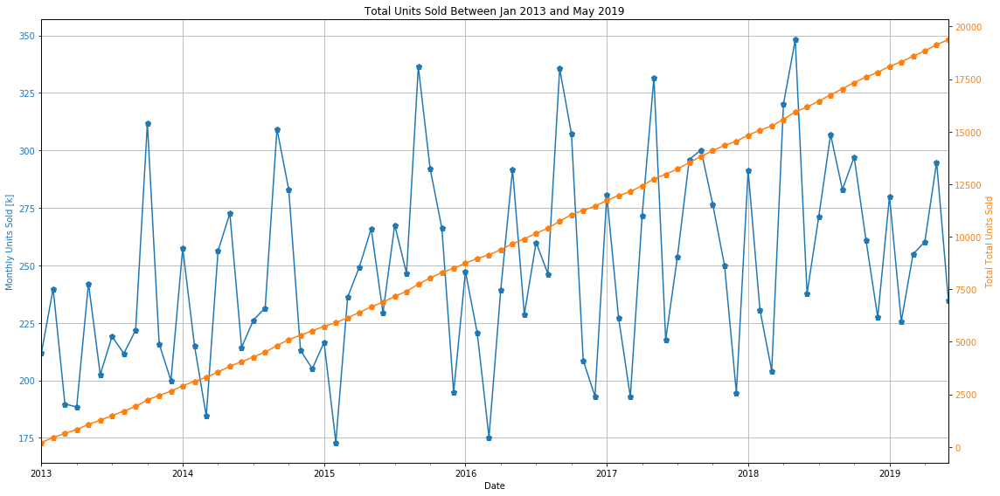

In [34]:
plotSalesData(salesdata, 2013, (16,8))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=634.152, BIC=645.024, Fit time=0.352 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=681.792, BIC=686.140, Fit time=0.048 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=667.701, BIC=676.398, Fit time=0.138 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=632.294, BIC=640.991, Fit time=0.248 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=632.386, BIC=643.258, Fit time=0.416 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=639.198, BIC=645.722, Fit time=0.101 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=673.538, BIC=680.062, Fit time=0.083 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=634.0

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


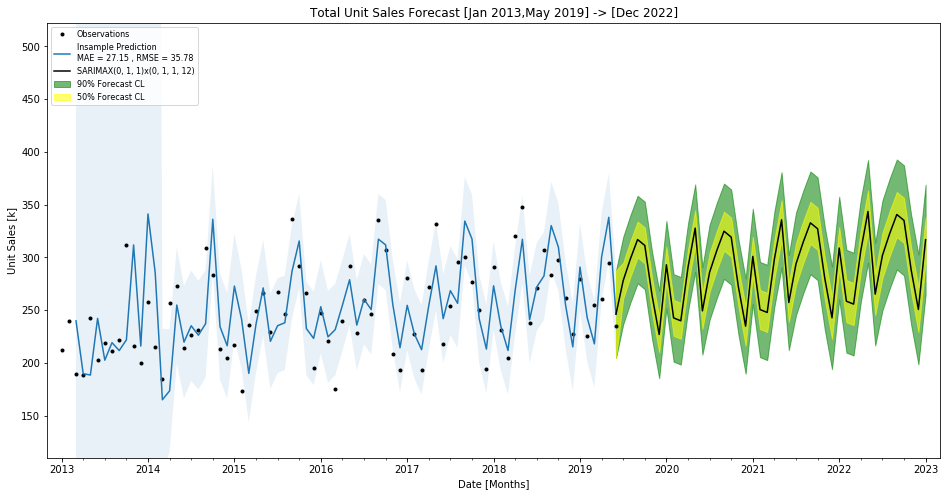

In [35]:
totalfullresults = fitSalesData(salesdata, (16,8))

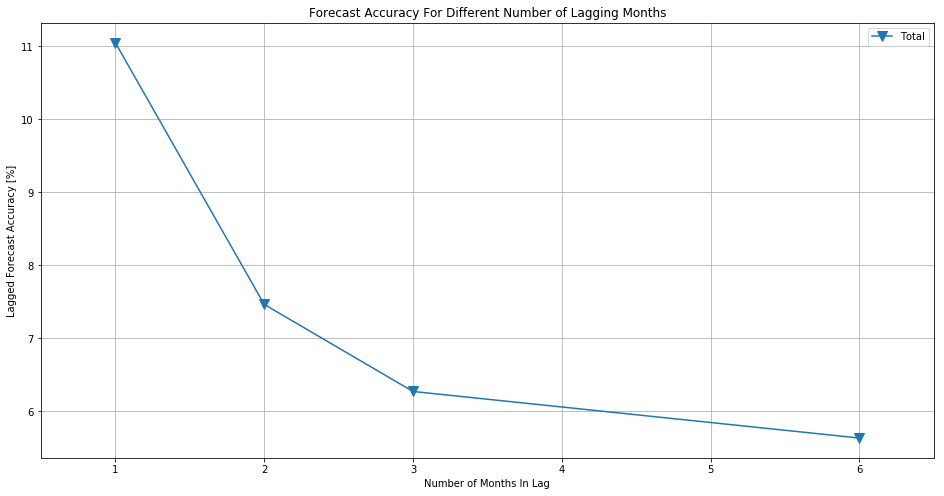

In [36]:
plotResiduals(totalfullresults, size=(16,8))

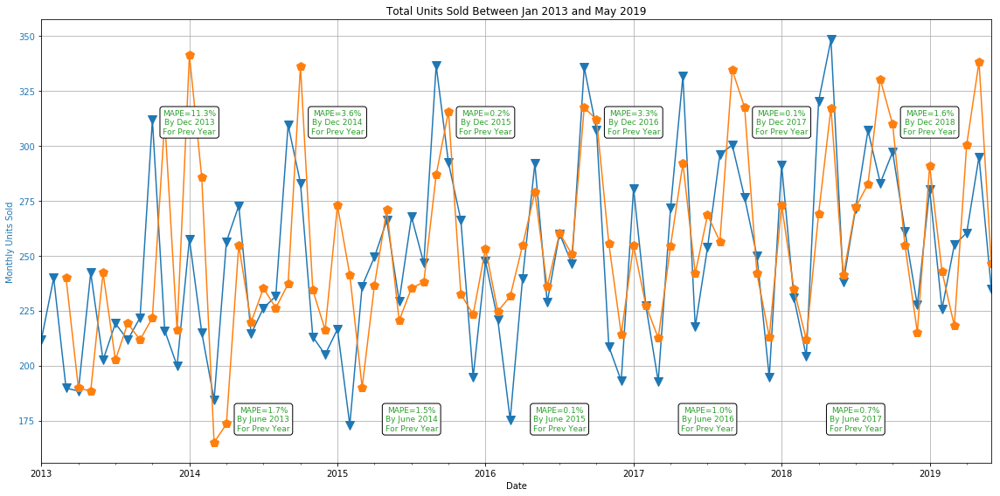

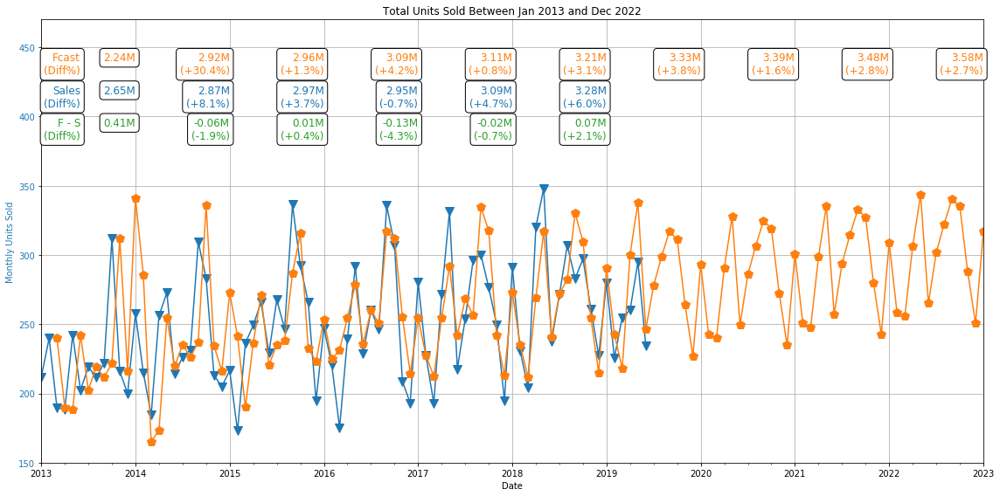

In [37]:
indivMapePlots(totalfullresults, startYear, size=(16,8))
totalfullresultsdf = masterPlot(totalfullresults, startYear, size=(16,8), fontsize=12)
#totalfullresultsdf

In [38]:
totalfullresultsdf

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,2243.215,411.765,15.509,NaN,NaN,None
2014,2868.731,2924.891,-56.160,-1.958,7.451,23.306,10.2
2015,2974.226,2963.327,10.899,0.366,3.547,1.297,3.3
2016,2954.154,3088.267,-134.113,-4.540,-0.679,4.046,3.83
2017,3092.653,3114.201,-21.548,-0.697,4.478,0.833,5.42
2018,3279.449,3210.759,68.690,2.095,5.696,3.007,3.82
2019,1550.477,3332.045,NaN,NaN,NaN,3.640,1.6
2020,0.000,3386.443,NaN,NaN,NaN,1.606,1.63
2021,0.000,3481.406,NaN,NaN,NaN,2.728,2.8
2022,0.000,3576.370,NaN,NaN,NaN,2.655,2.73


In [190]:
# Brian Delph's Report 2006-2010
#   Sandy Sershal (consultant, old VP)

In [184]:
3.333/3.279-1

0.016468435498627754

## Profit Center Prediction

In [39]:
data = read_pickle("Aggdata/ProfitCenterSales.p")
startYear = 2013
salesdata = cutData(data, startYear)

## CUSTOMER INVENTORY SALES  (15 WEEKS OF SUPPLY VS 6-14)
## MAJOR ISSUES IN THE LATTER PART OF THE YEAR
## POS DATA IS BETTER THAN SHIPMENT DATA

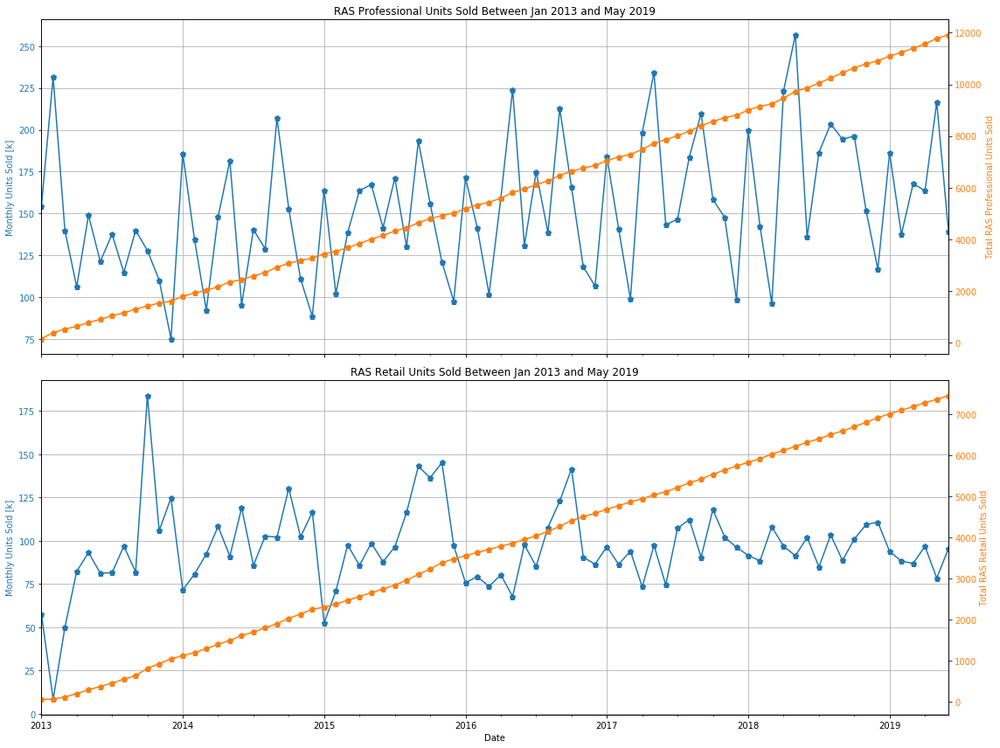

In [40]:
plotSalesData(salesdata, startYear, (16,12))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=631.542, BIC=642.414, Fit time=0.290 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=677.520, BIC=681.869, Fit time=0.008 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=662.650, BIC=671.348, Fit time=0.125 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=629.604, BIC=638.302, Fit time=0.194 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=631.584, BIC=642.456, Fit time=0.328 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=632.735, BIC=639.258, Fit time=0.068 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=668.856, BIC=675.379, Fit time=0.081 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=nan, 

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


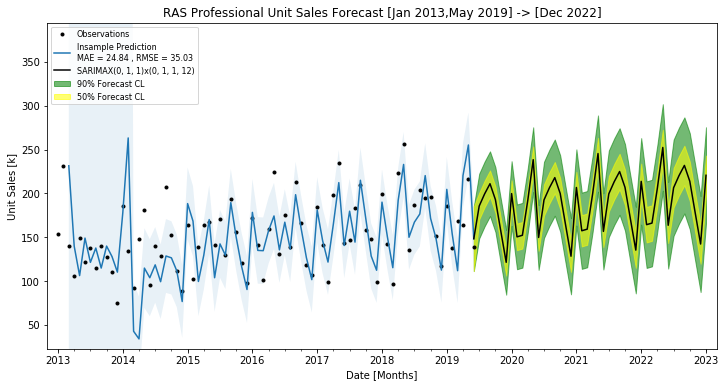

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


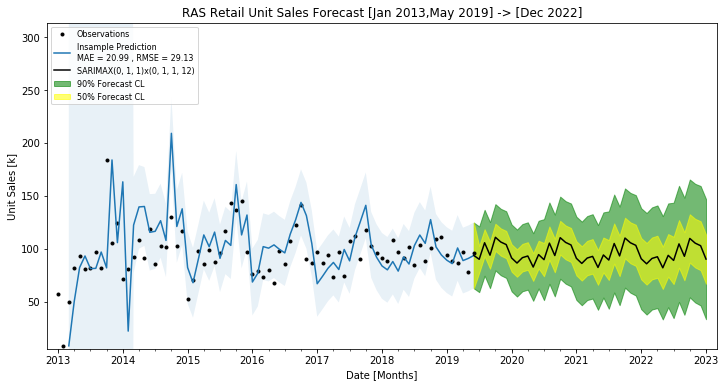

In [41]:
pcfullresults = fitSalesData(salesdata, (12,6))

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,2243.219,411.761,15.509,NaN,NaN,None
2014,2868.731,2918.525,-49.794,-1.736,7.451,23.139,9.93
2015,2974.226,2956.740,17.486,0.588,3.547,1.292,3.07
2016,2954.154,3074.955,-120.801,-4.089,-0.679,3.844,3.39
2017,3092.653,3069.378,23.275,0.753,4.478,-0.182,3.9
2018,3279.449,3180.681,98.768,3.012,5.696,3.499,2.85
2019,1550.477,3321.674,NaN,NaN,NaN,4.245,1.29
2020,0.000,3340.415,NaN,NaN,NaN,0.561,0.564
2021,0.000,3419.677,NaN,NaN,NaN,2.318,2.37
2022,0.000,3498.938,NaN,NaN,NaN,2.265,2.32


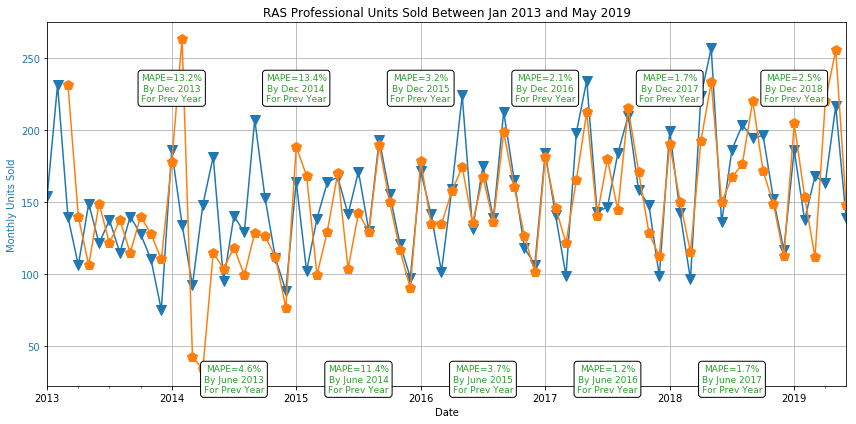

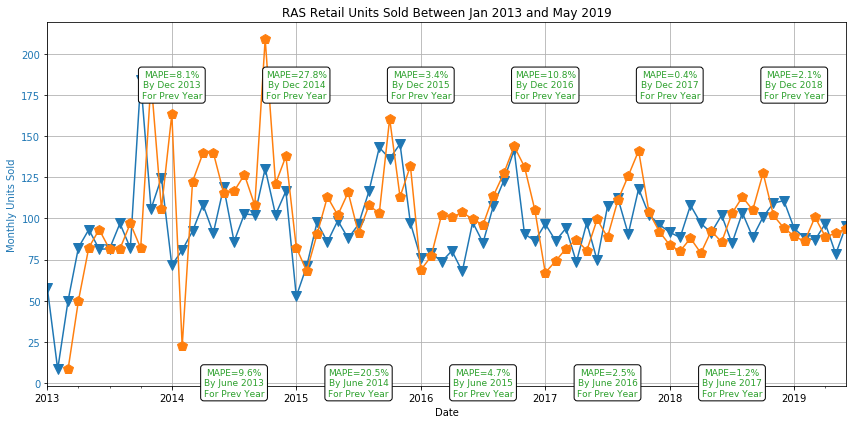

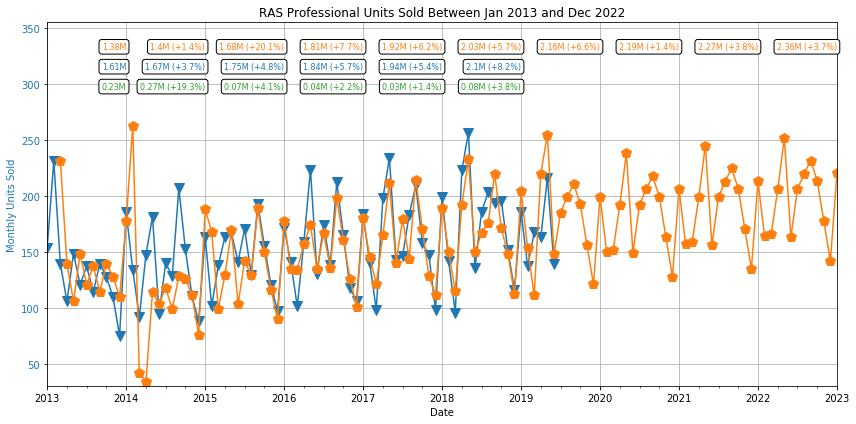

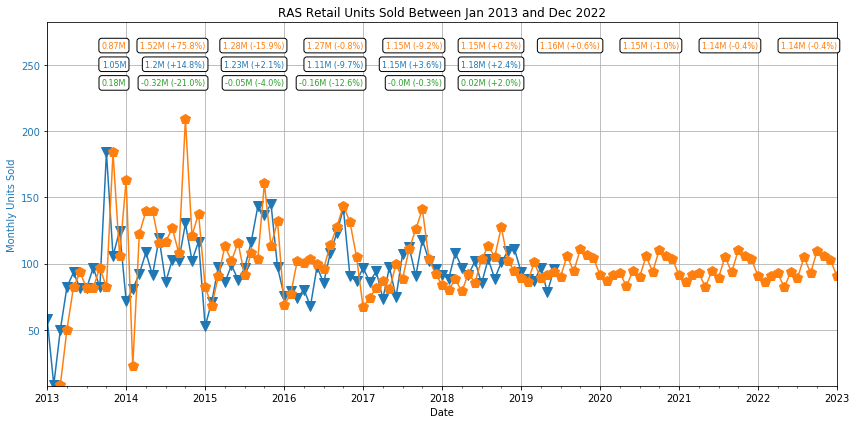

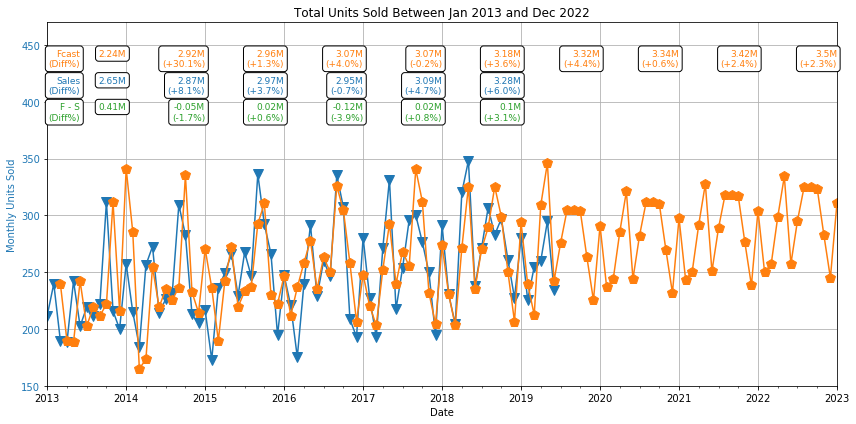

In [42]:
indivMapePlots(pcfullresults, startYear, (12,6))
indivMasterPlots(pcfullresults, startYear, (12,6))
pcfullresultsdf = masterPlot(pcfullresults, startYear, (12,6))
pcfullresultsdf

## Category Prediction

In [43]:
data = read_pickle("Aggdata/CategorySales.p")
startYear = 2013
salesdata = cutData(data, startYear)

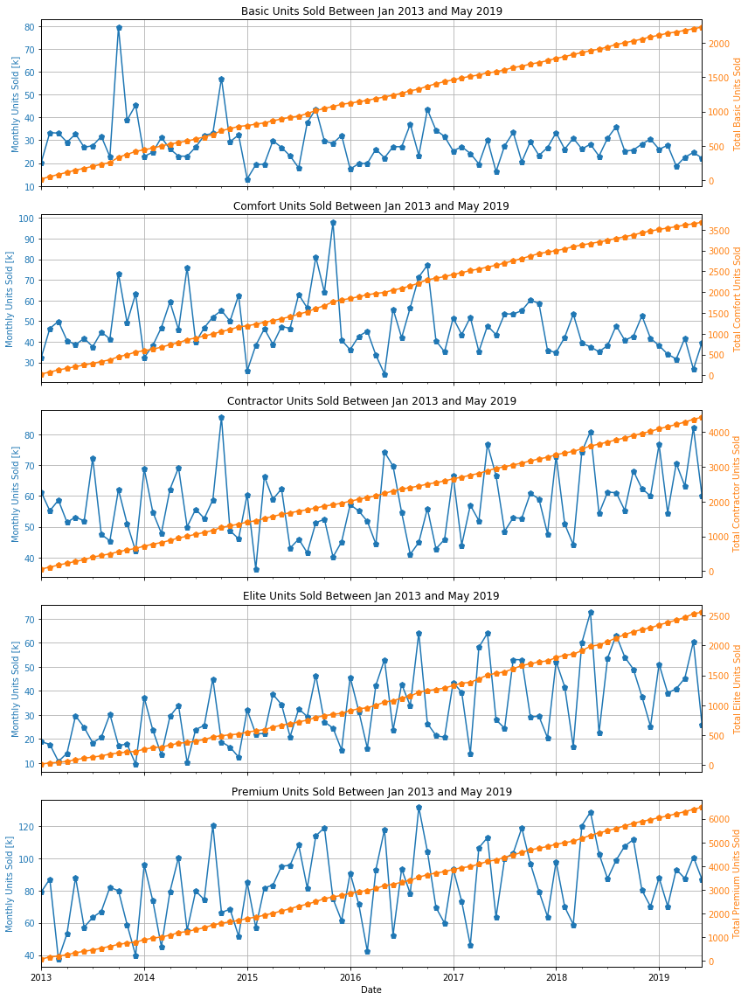

In [44]:
plotSalesData(salesdata, startYear, size=(12,16))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=465.752, BIC=476.624, Fit time=0.316 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=505.181, BIC=509.530, Fit time=0.008 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=487.418, BIC=496.115, Fit time=0.101 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=463.780, BIC=472.477, Fit time=0.336 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=465.491, BIC=476.363, Fit time=0.402 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=464.068, BIC=470.592, Fit time=0.080 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=504.082, BIC=510.605, Fit time=0.052 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=465.7

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


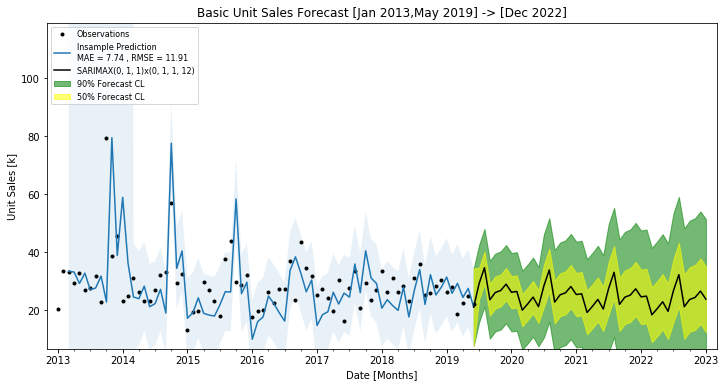

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


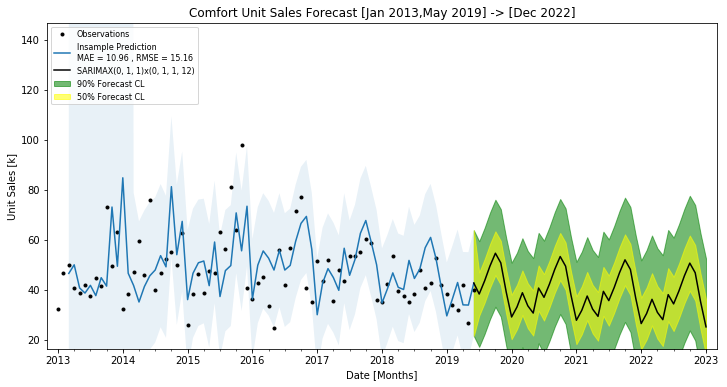

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


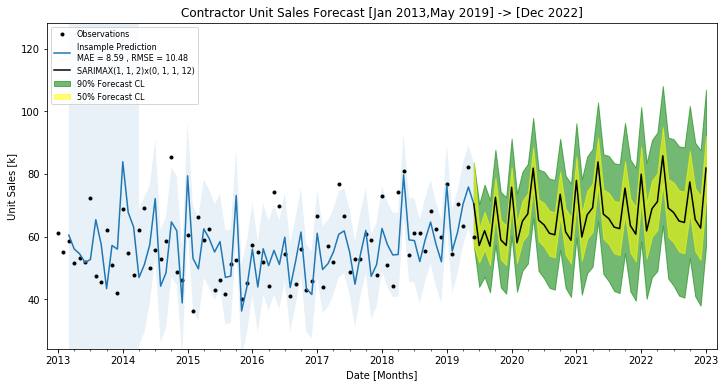

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


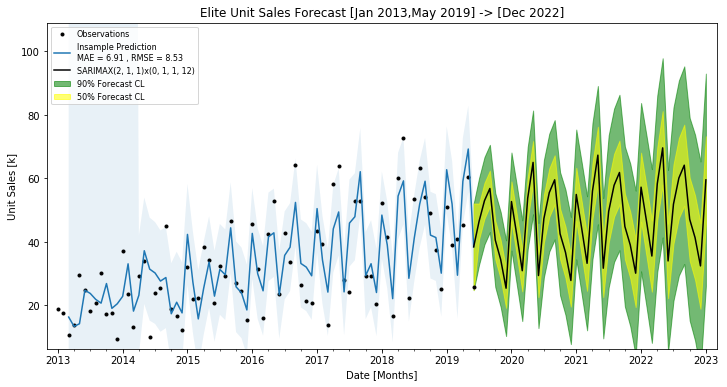

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


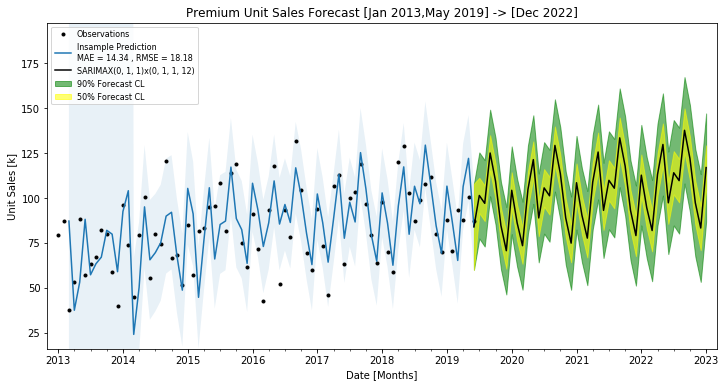

In [45]:
catfullresults = fitSalesData(salesdata)

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,2250.252,404.728,15.244,NaN,NaN,None
2014,2868.731,2944.959,-76.228,-2.657,7.451,23.590,10.9
2015,2974.226,2942.925,31.301,1.052,3.547,-0.069,2.59
2016,2954.154,3075.128,-120.974,-4.095,-0.679,4.299,3.39
2017,3092.653,3126.317,-33.664,-1.089,4.478,1.637,5.83
2018,3279.449,3223.612,55.837,1.703,5.696,3.018,4.23
2019,1550.477,3323.367,NaN,NaN,NaN,3.002,1.34
2020,0.000,3305.552,NaN,NaN,NaN,-0.539,-0.536
2021,0.000,3381.854,NaN,NaN,NaN,2.256,2.31
2022,0.000,3458.080,NaN,NaN,NaN,2.204,2.25


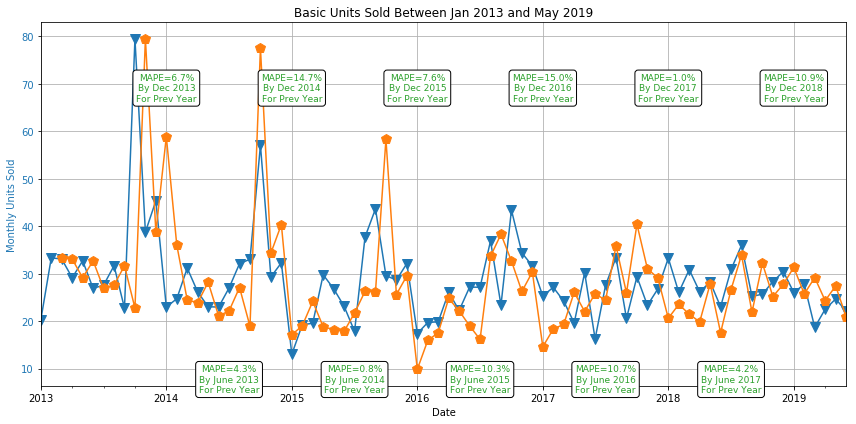

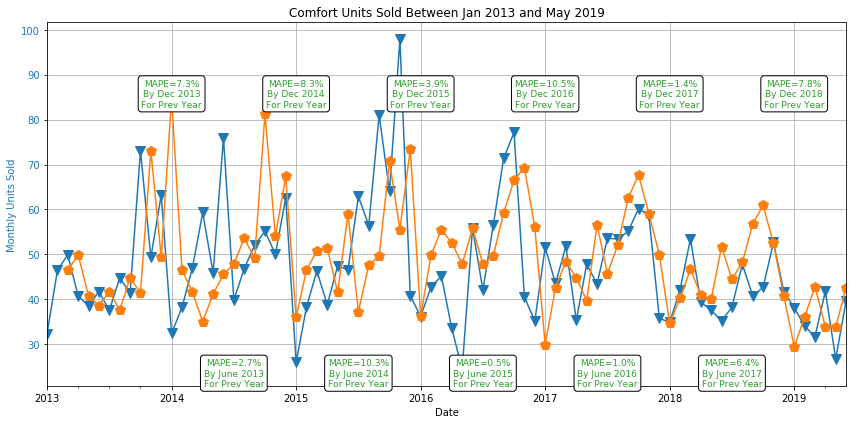

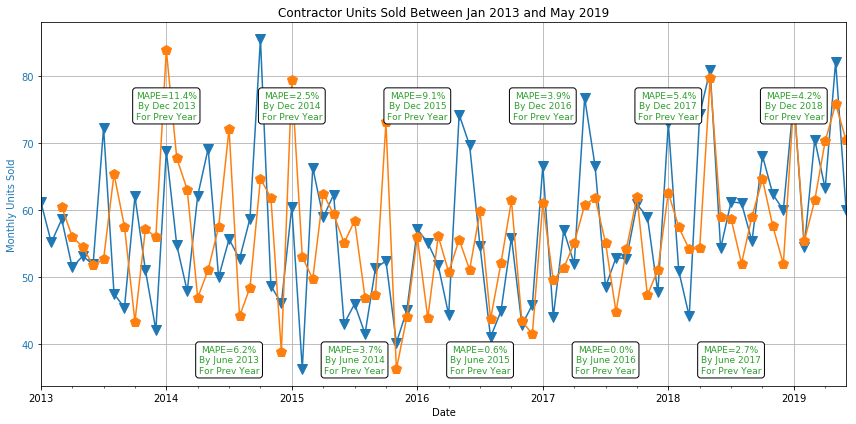

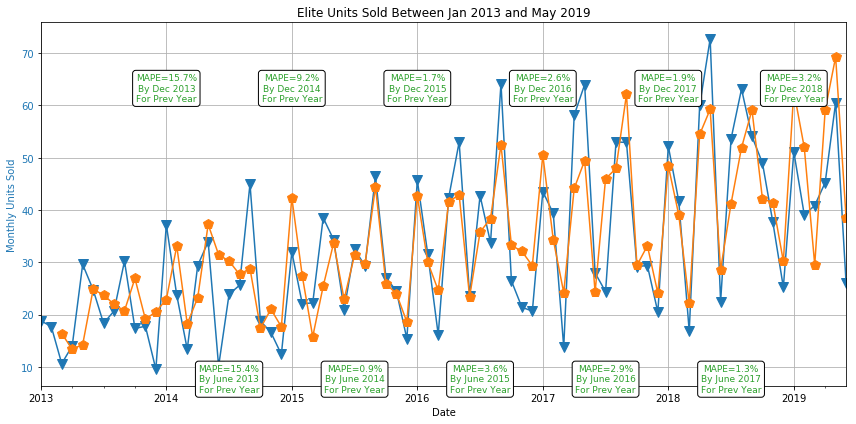

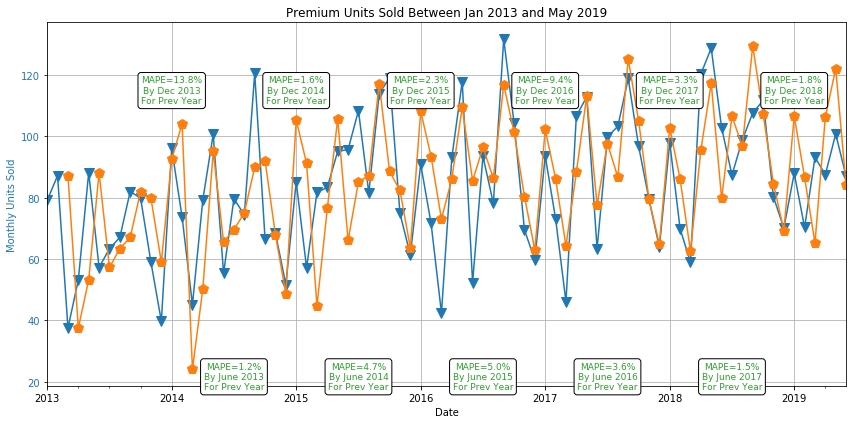

...

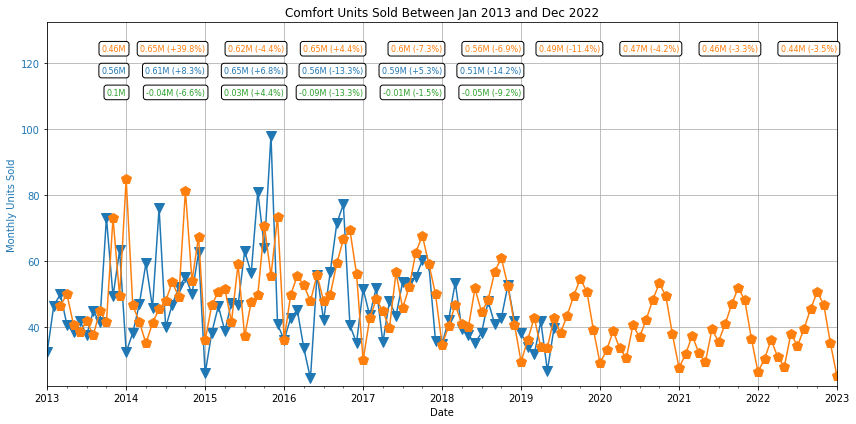

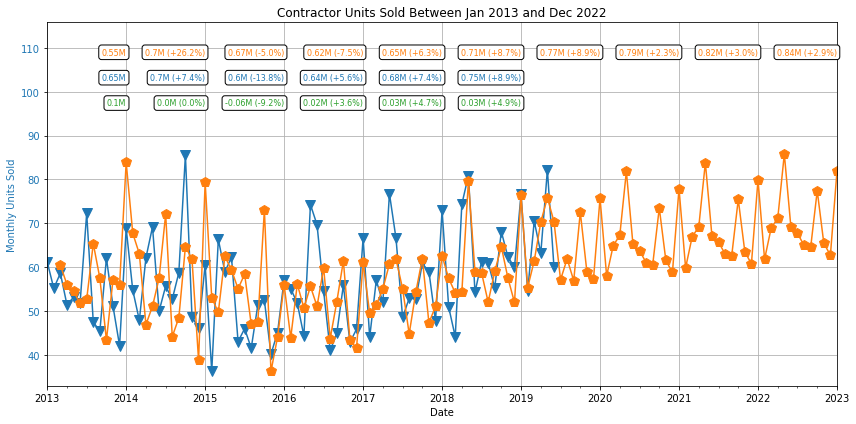

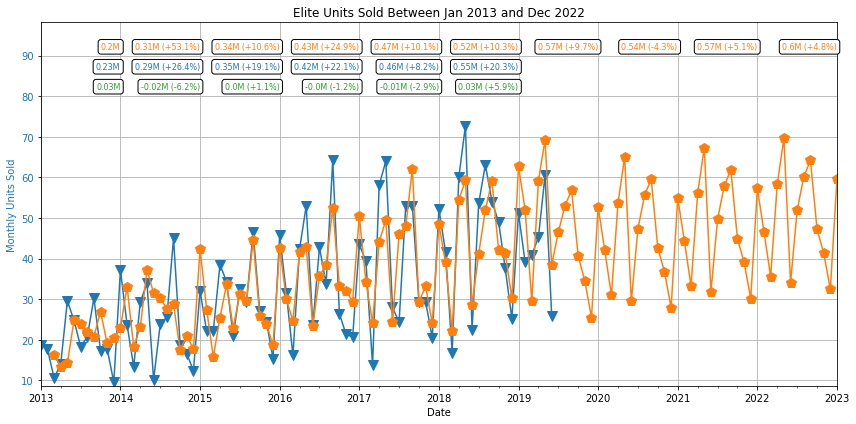

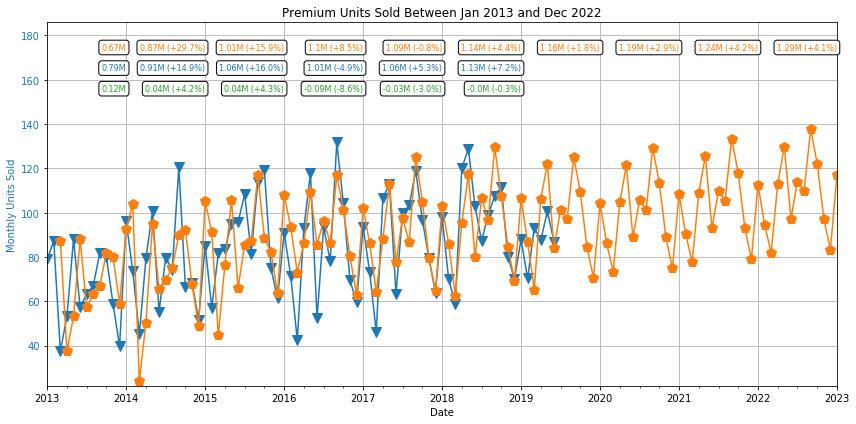

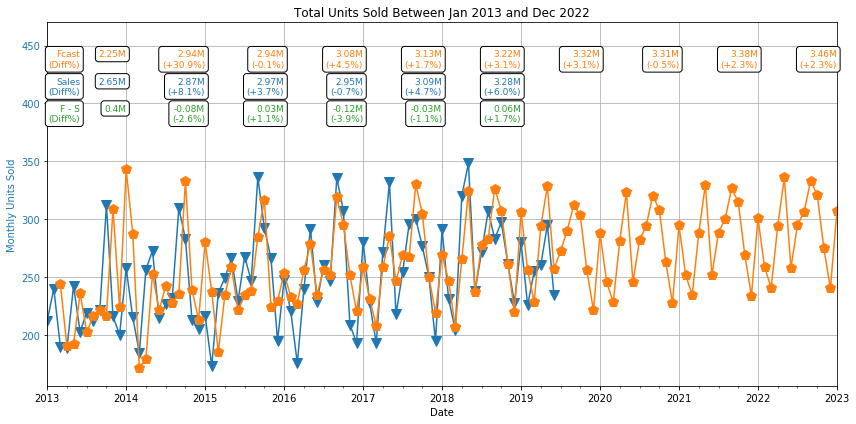

In [46]:
indivMapePlots(catfullresults, startYear)
indivMasterPlots(catfullresults, startYear)
catfullresultsdf = masterPlot(catfullresults, startYear)
catfullresultsdf

# Regional Sales

In [47]:
data = read_pickle("Aggdata/RegionalSales.p")
startYear = 2013
salesdata = cutData(data, startYear)

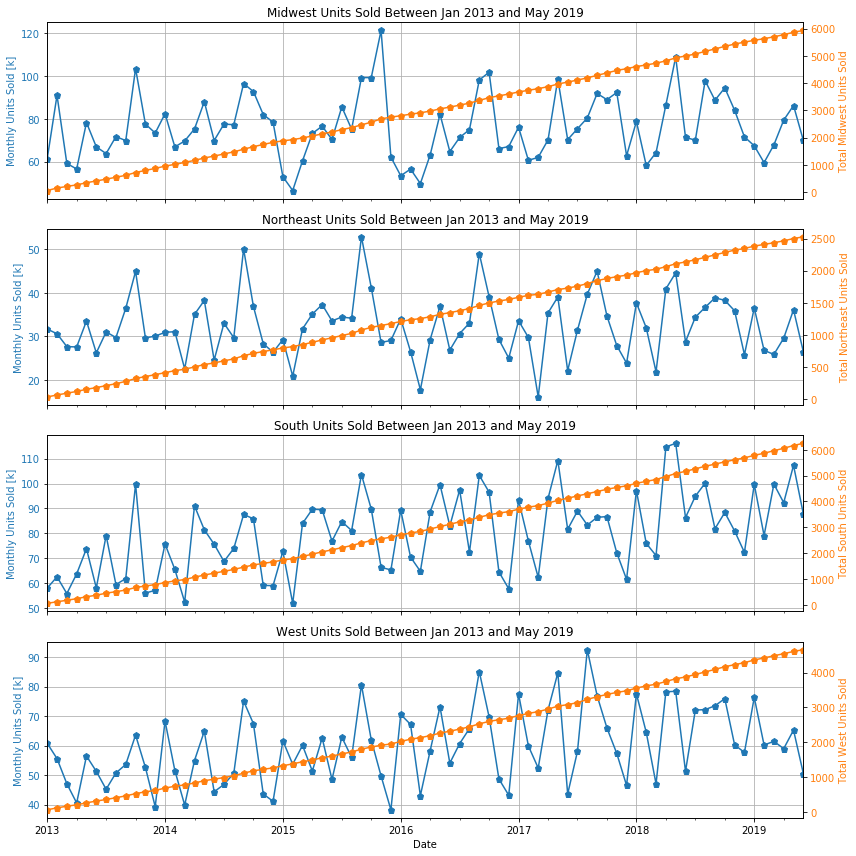

In [48]:
plotSalesData(salesdata, startYear, size=(12,12))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=526.693, BIC=537.565, Fit time=0.319 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=580.819, BIC=585.168, Fit time=0.087 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=554.163, BIC=562.861, Fit time=0.098 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=524.825, BIC=533.522, Fit time=0.289 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=526.675, BIC=537.547, Fit time=0.438 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=540.712, BIC=547.235, Fit time=0.080 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=559.629, BIC=566.152, Fit time=0.148 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=526.6

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


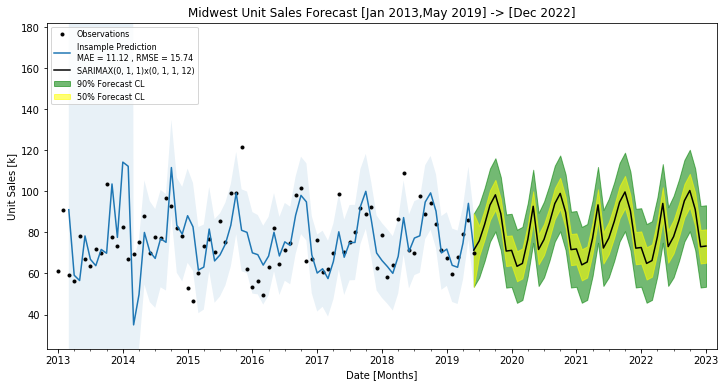

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


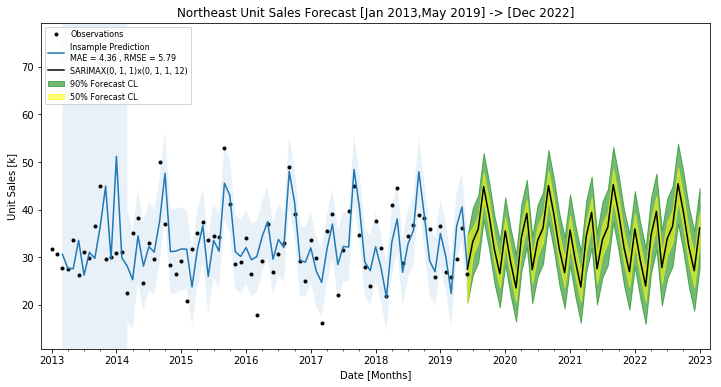

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


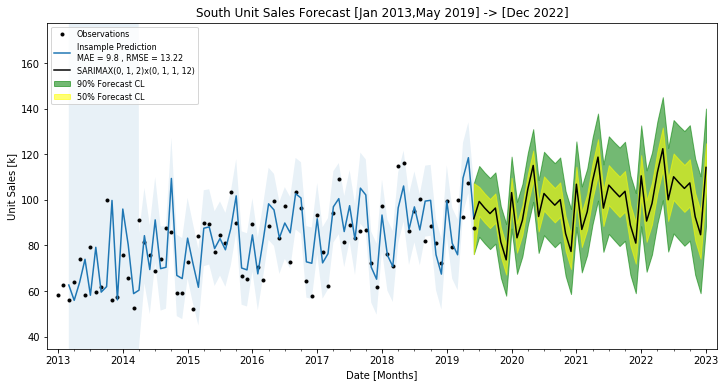

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


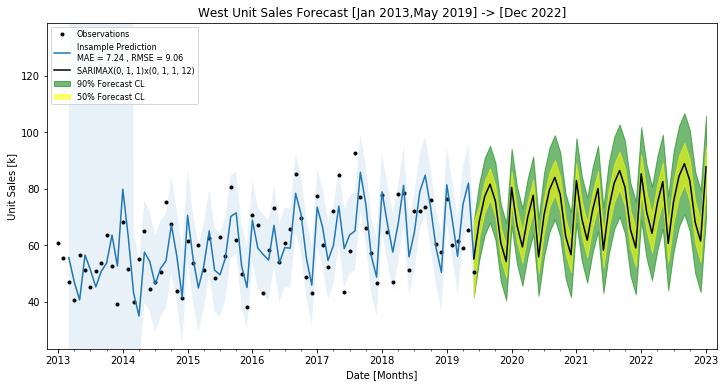

In [49]:
regfullresults = fitSalesData(salesdata)

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,2243.216,411.764,15.509,NaN,NaN,None
2014,2868.731,2935.266,-66.535,-2.319,7.451,23.577,10.6
2015,2974.226,2970.626,3.600,0.121,3.547,1.190,3.55
2016,2954.154,3089.897,-135.743,-4.595,-0.679,3.860,3.89
2017,3092.653,3110.906,-18.253,-0.590,4.478,0.675,5.31
2018,3279.449,3192.400,87.049,2.654,5.696,2.553,3.23
2019,1550.477,3306.639,NaN,NaN,NaN,3.455,0.829
2020,0.000,3352.429,NaN,NaN,NaN,1.366,1.38
2021,0.000,3436.477,NaN,NaN,NaN,2.446,2.51
2022,0.000,3520.524,NaN,NaN,NaN,2.387,2.45


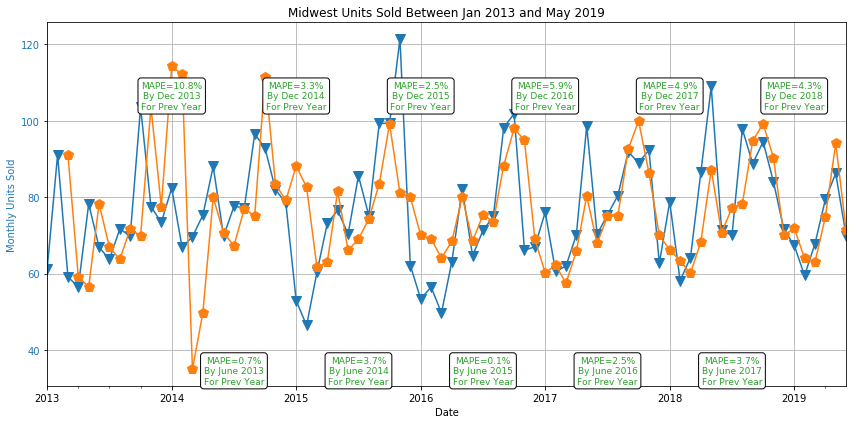

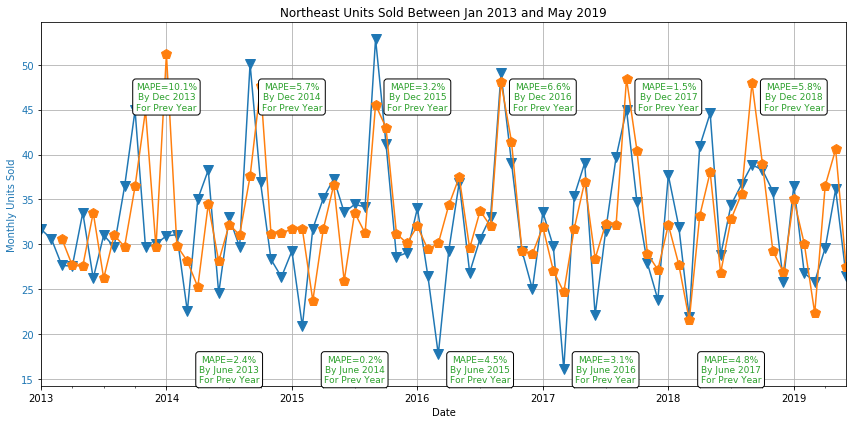

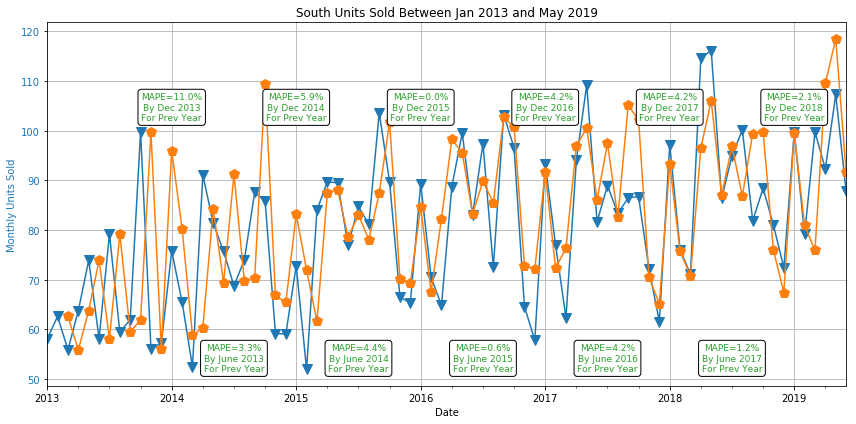

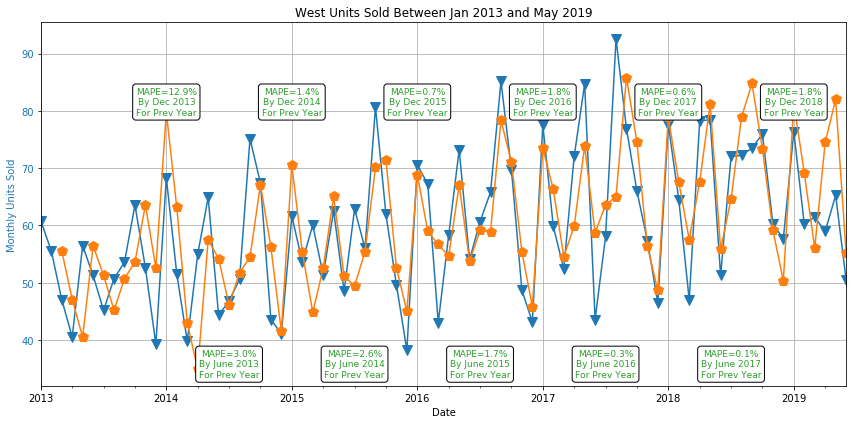

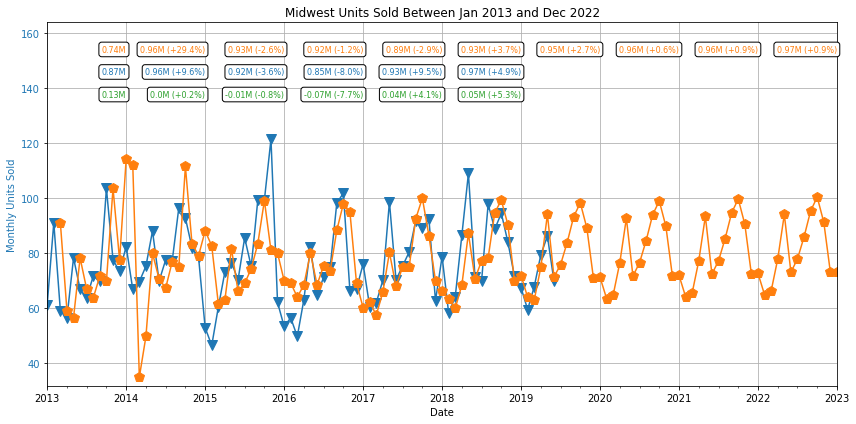

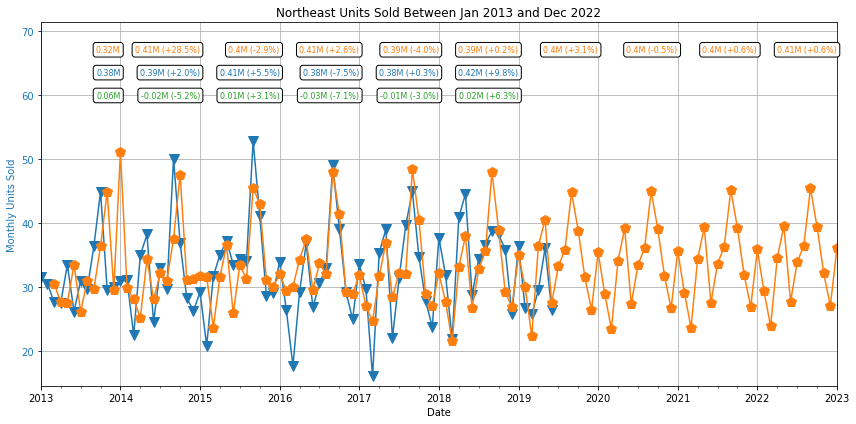

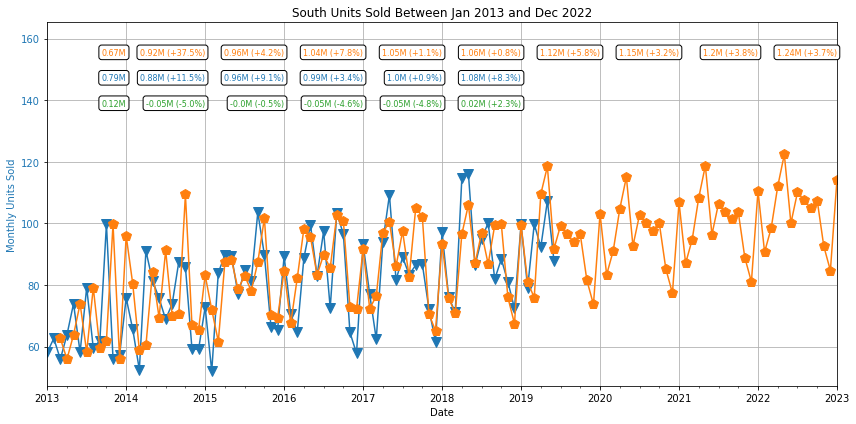

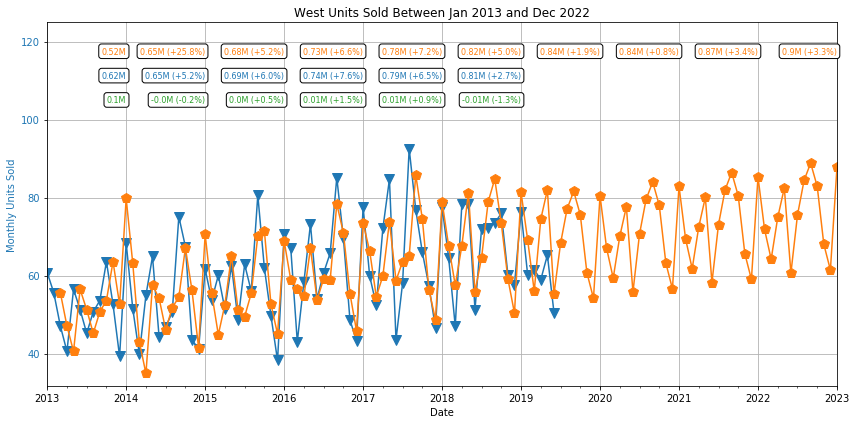

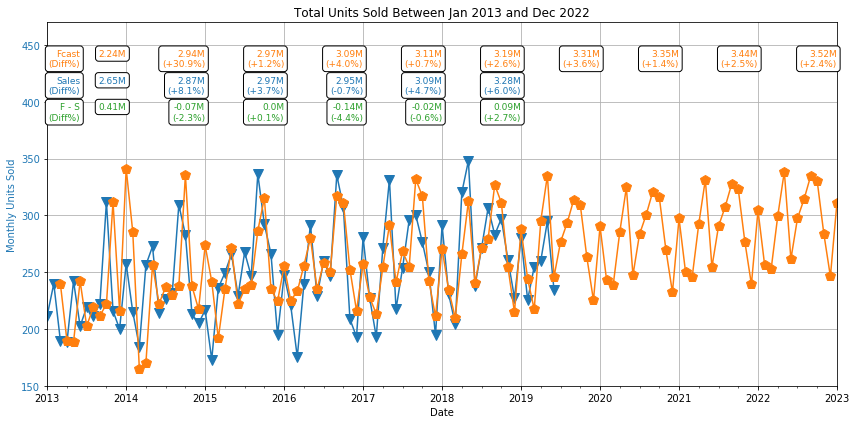

In [50]:
indivMapePlots(regfullresults, startYear)
indivMasterPlots(regfullresults, startYear)
regfullresultsdf = masterPlot(regfullresults, startYear)
regfullresultsdf

# Profit Center / Category Sales

In [51]:
data = read_pickle("Aggdata/ProfitCenterCategorySales.p")
startYear = 2013
salesdata = cutData(data, startYear)

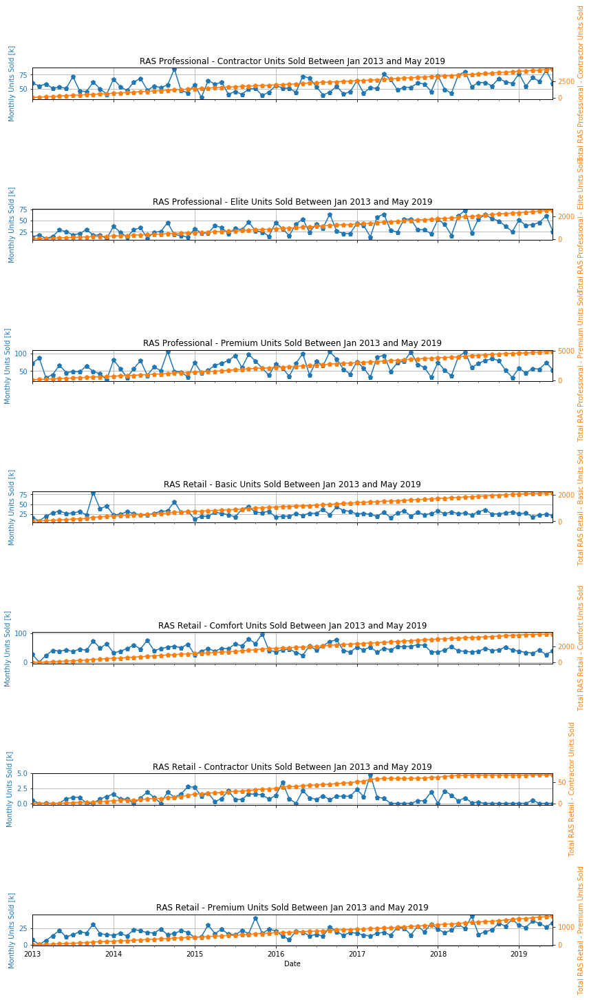

In [52]:
plotSalesData(salesdata, startYear, size=(12,20))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=489.752, BIC=500.624, Fit time=0.403 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=542.526, BIC=546.875, Fit time=0.008 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=523.892, BIC=532.590, Fit time=0.104 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=488.049, BIC=496.747, Fit time=0.362 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=489.830, BIC=500.702, Fit time=0.333 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=507.206, BIC=513.729, Fit time=0.072 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=521.013, BIC=527.536, Fit time=0.069 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=nan, 

Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=453.044, BIC=463.916, Fit time=0.186 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 12); AIC=457.686, BIC=466.384, Fit time=0.079 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=480.646, BIC=487.169, Fit time=0.048 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(2, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=454.962, BIC=468.008, Fit time=0.230 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(1, 1, 1, 12); AIC=484.816, BIC=493.513, Fit time=0.174 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(1, 1, 1, 12); AIC=454.951, BIC=467.997, Fit time=0.193 seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(1, 1, 1, 12); AIC=455.404, BIC=470.625, Fit time=0.682 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(2, 1, 1, 12); AIC=454.8

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


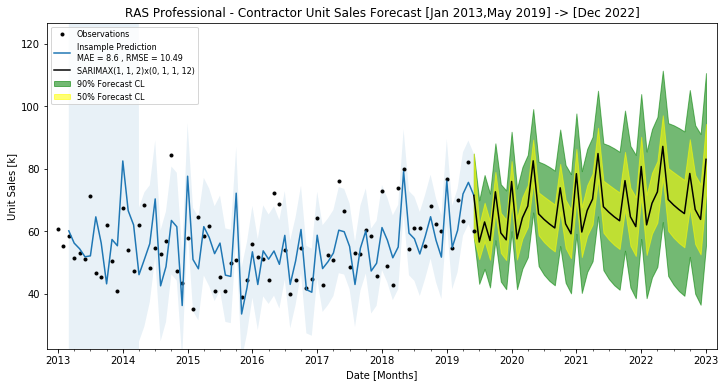

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


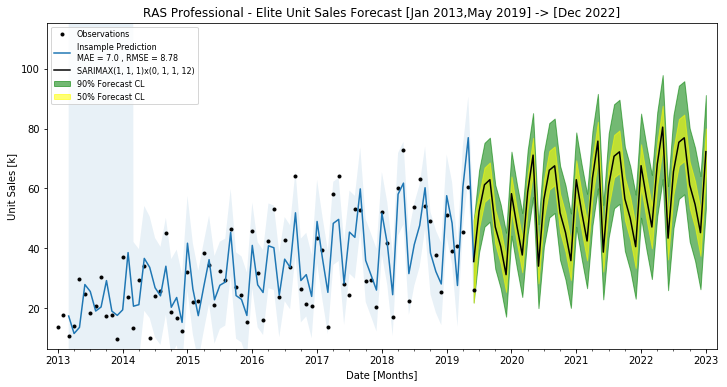

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


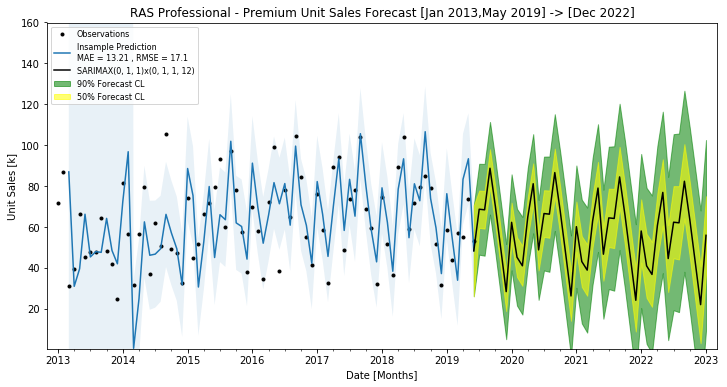

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


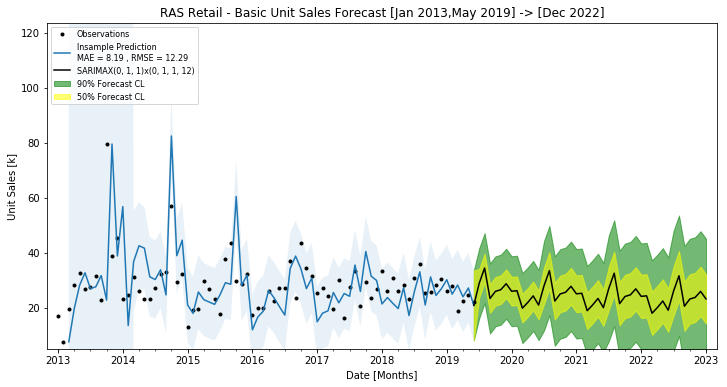

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


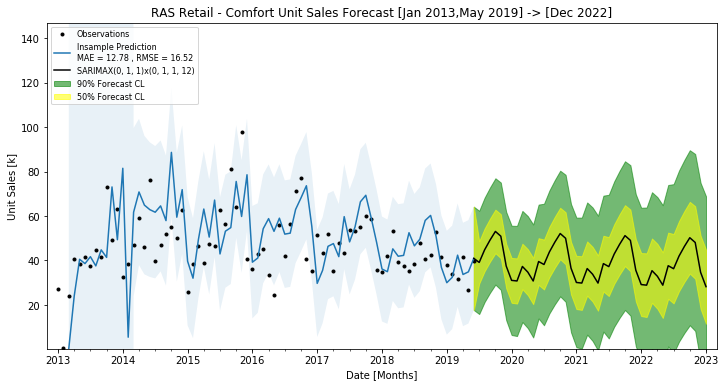

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


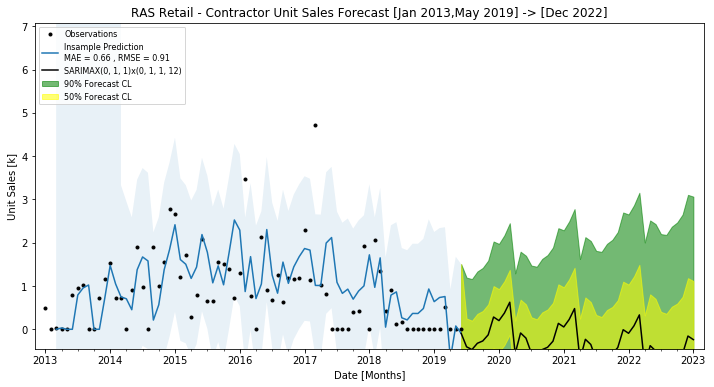

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


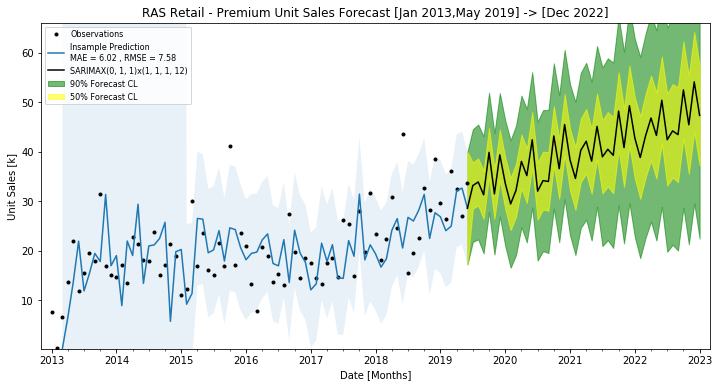

In [53]:
pccatfullresults = fitSalesData(salesdata)

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2529.107,2136.579,392.528,15.520,NaN,NaN,None
2014,2868.731,3072.997,-204.266,-7.120,11.839,30.472,21.5
2015,2974.226,3016.609,-42.383,-1.425,3.547,-1.869,5.15
2016,2954.154,3071.343,-117.189,-3.967,-0.679,1.782,3.27
2017,3092.653,3131.098,-38.445,-1.243,4.478,1.908,5.99
2018,3279.449,3204.367,75.082,2.289,5.696,2.287,3.61
2019,1550.477,3331.171,NaN,NaN,NaN,3.807,1.58
2020,0.000,3339.924,NaN,NaN,NaN,0.262,0.263
2021,0.000,3433.567,NaN,NaN,NaN,2.727,2.8
2022,0.000,3519.595,NaN,NaN,NaN,2.444,2.51


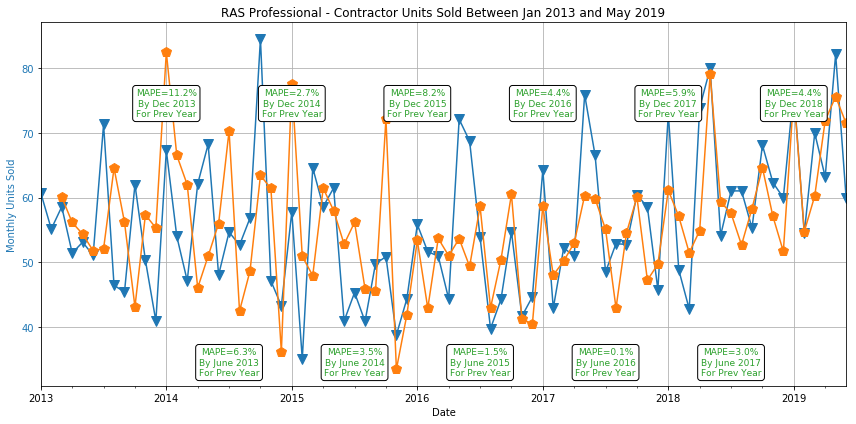

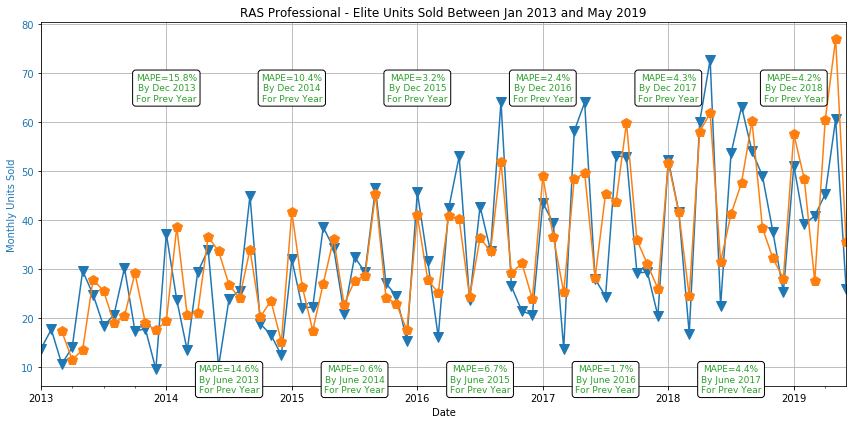

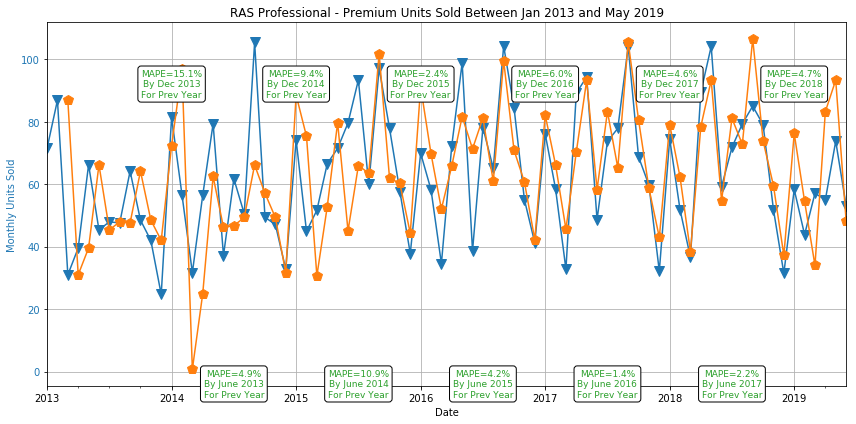

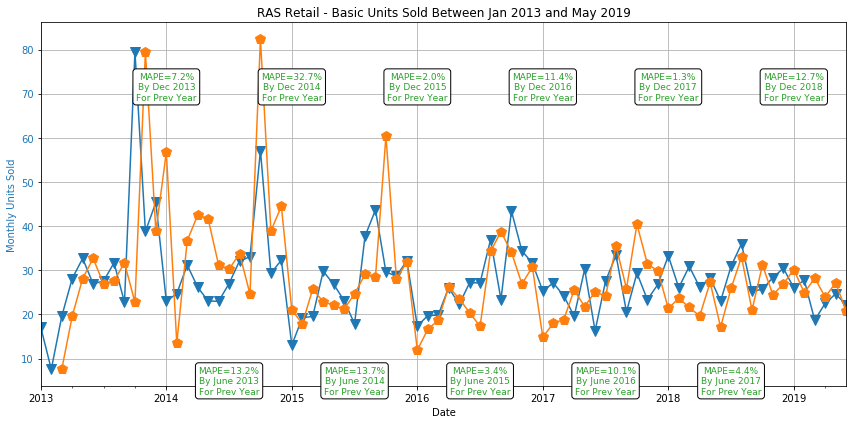

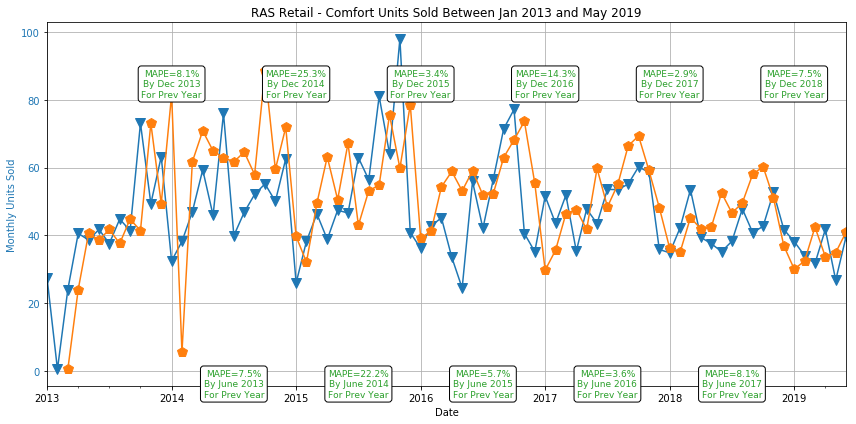

...

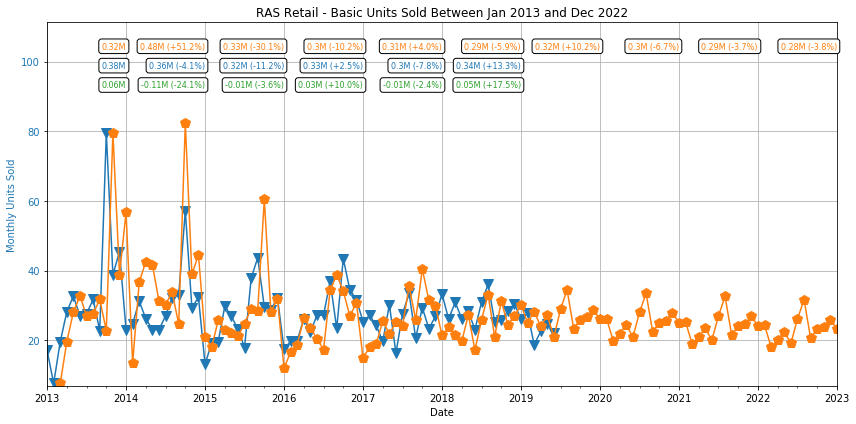

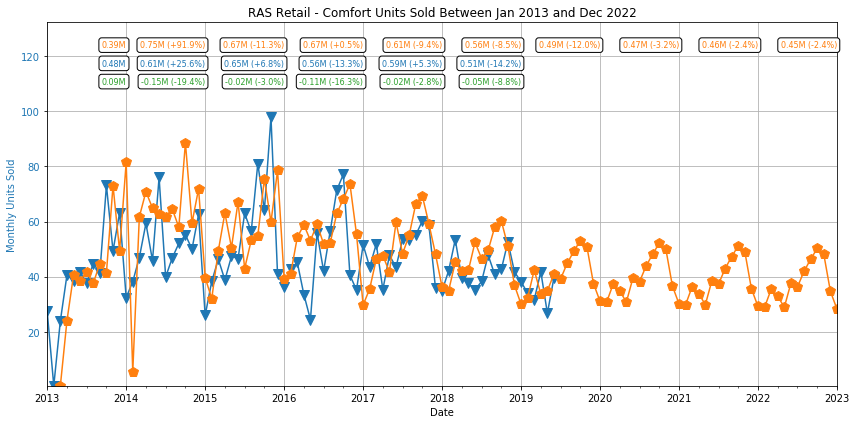

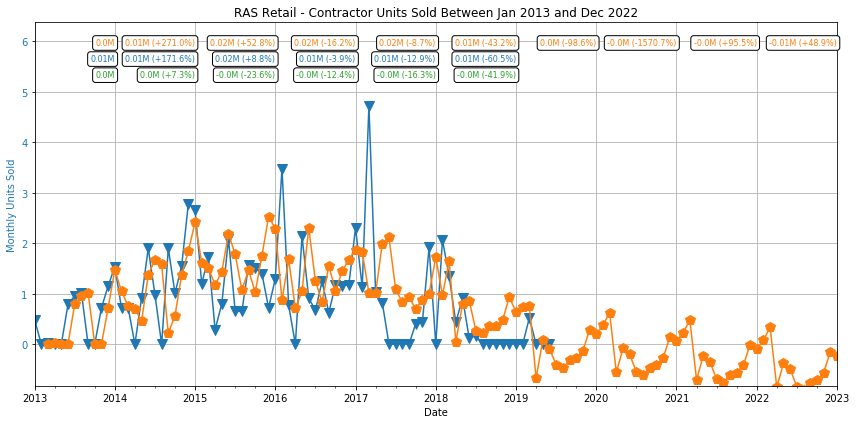

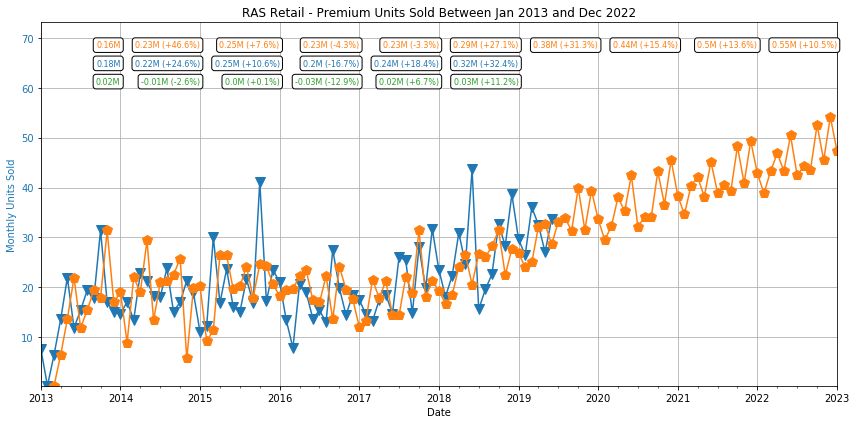

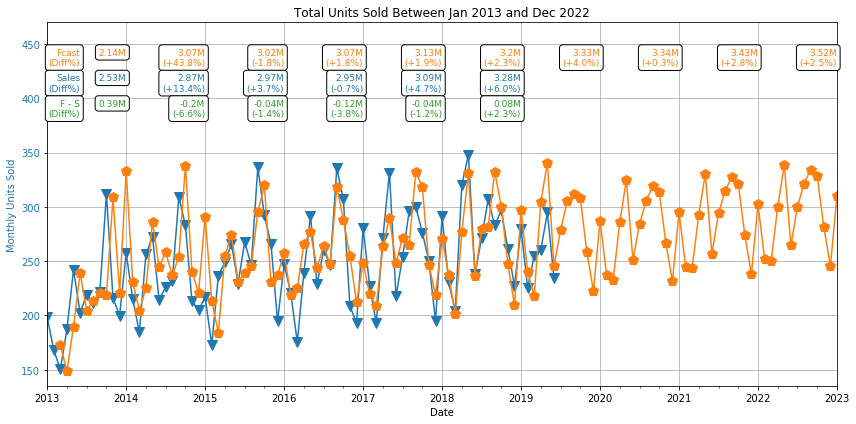

In [54]:
indivMapePlots(pccatfullresults, startYear)
indivMasterPlots(pccatfullresults, startYear)
pccatfullresultsdf = masterPlot(pccatfullresults, startYear)
pccatfullresultsdf

# Profit Center / Category / Region Sales

In [55]:
data = read_pickle("Aggdata/ProfitCenterCategoryRegionSales.p")
startYear = 2013
salesdata = cutData(data, startYear)

/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '
/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '
/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '
/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied

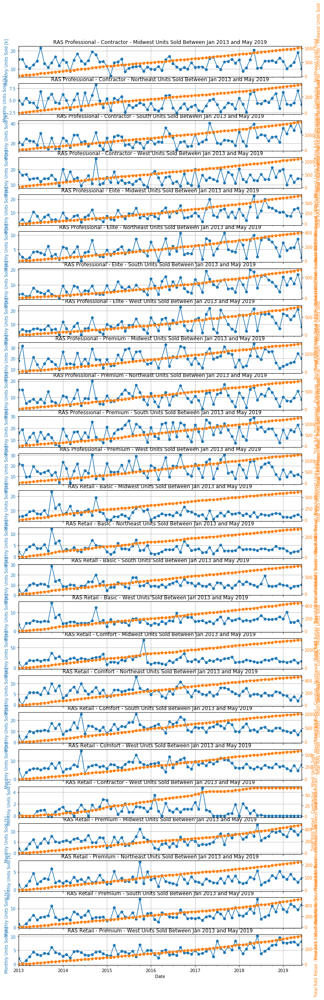

In [56]:
plotSalesData(salesdata, startYear, size=(12,40))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=384.463, BIC=388.812, Fit time=0.009 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=379.371, BIC=388.069, Fit time=0.083 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=347.381, BIC=356.078, Fit time=0.257 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=349.337, BIC=360.209, Fit time=0.480 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=363.323, BIC=369.846, Fit time=0.039 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=370.433, BIC=376.956, Fit time=0.052 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=nan, BIC=nan, F

Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=326.450, BIC=337.322, Fit time=0.434 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 12); AIC=331.316, BIC=340.014, Fit time=0.278 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=330.713, BIC=337.236, Fit time=0.151 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(2, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=328.411, BIC=341.457, Fit time=0.542 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(1, 1, 1, 12); AIC=361.480, BIC=370.178, Fit time=0.265 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(1, 1, 1, 12); AIC=328.404, BIC=341.450, Fit time=0.606 seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(1, 1, 1, 12); AIC=328.326, BIC=343.547, Fit time=0.617 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(2, 1, 1, 12); AIC=326.9

Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=316.281, BIC=324.978, Fit time=0.249 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=317.494, BIC=330.540, Fit time=0.430 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=329.916, BIC=338.614, Fit time=0.100 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=316.694, BIC=329.740, Fit time=0.544 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=331.124, BIC=339.822, Fit time=0.082 seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=316.012, BIC=329.059, Fit time=0.455 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=337.686, BIC=344.209, Fit time=0.058 seconds
Fit ARIMA: order=(2, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=317.9

Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=475.114, BIC=483.811, Fit time=0.259 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=476.865, BIC=487.737, Fit time=0.435 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=502.576, BIC=509.100, Fit time=0.077 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 12); AIC=514.829, BIC=521.352, Fit time=0.129 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=477.081, BIC=487.953, Fit time=0.301 seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(0, 1, 1, 12); AIC=478.787, BIC=491.833, Fit time=0.430 seconds
Total fit time: 2.009 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=283.040, BIC=293.912, Fit time=0.367 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_

Fit ARIMA: order=(1, 1, 1) seasonal_order=(2, 1, 1, 12); AIC=235.539, BIC=250.760, Fit time=0.530 seconds
Total fit time: 2.970 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=326.901, BIC=337.773, Fit time=0.156 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 12); AIC=392.908, BIC=397.257, Fit time=0.008 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 12); AIC=345.378, BIC=354.076, Fit time=0.078 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 12); AIC=325.359, BIC=334.056, Fit time=0.163 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 12); AIC=325.268, BIC=336.140, Fit time=0.201 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 12); AIC=329.164, BIC=337.861, Fit time=0.111 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 12); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 12); AIC=350.191, BIC=356.715, Fit time=0.056 seconds
Fit ARIMA: order=(0, 1, 1)

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


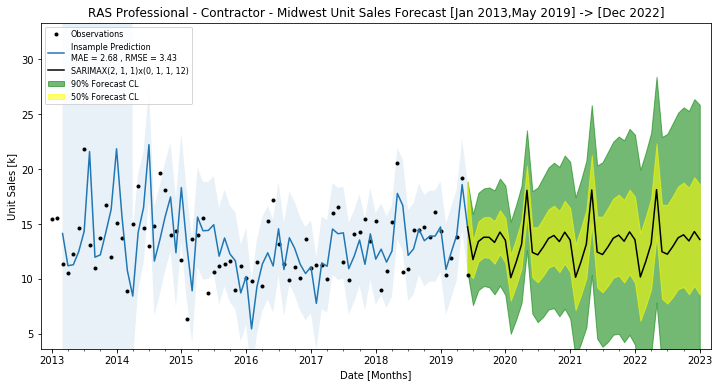

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


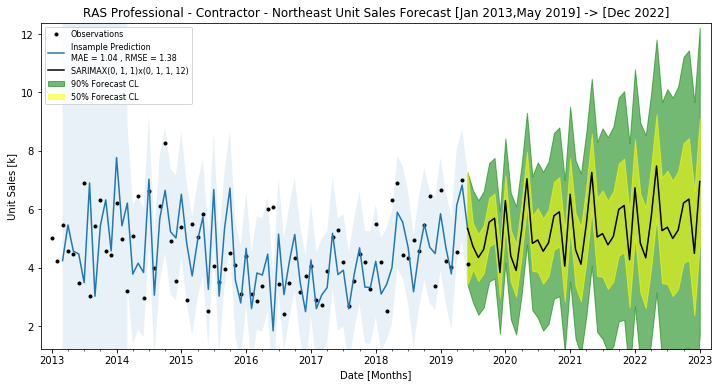

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


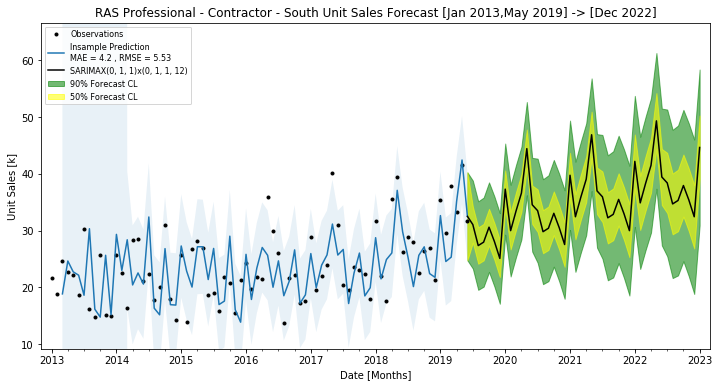

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


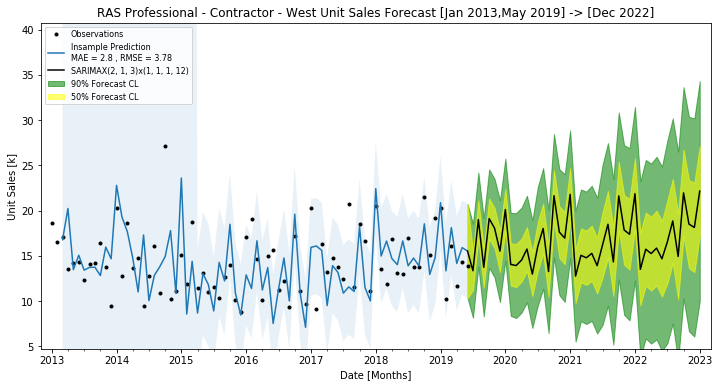

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


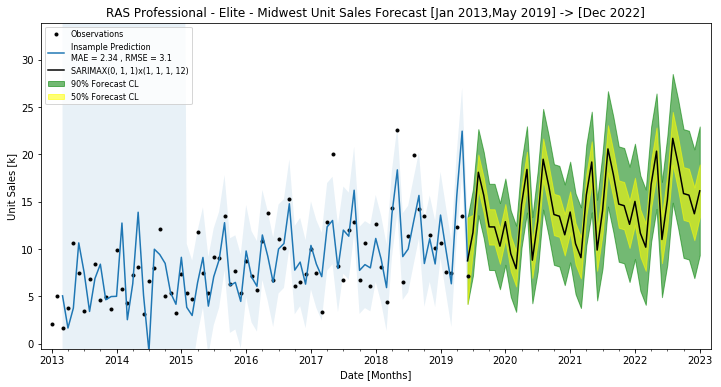

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


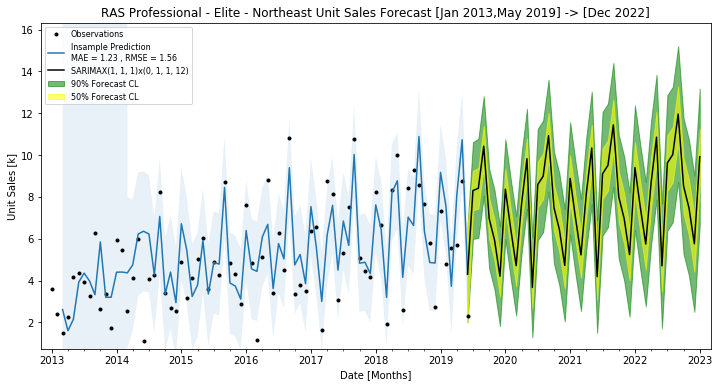

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


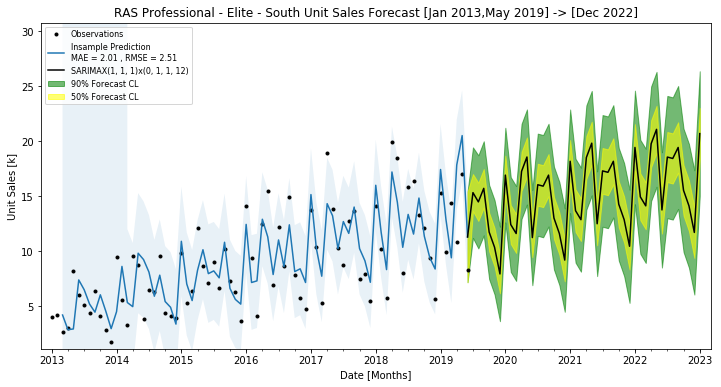

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


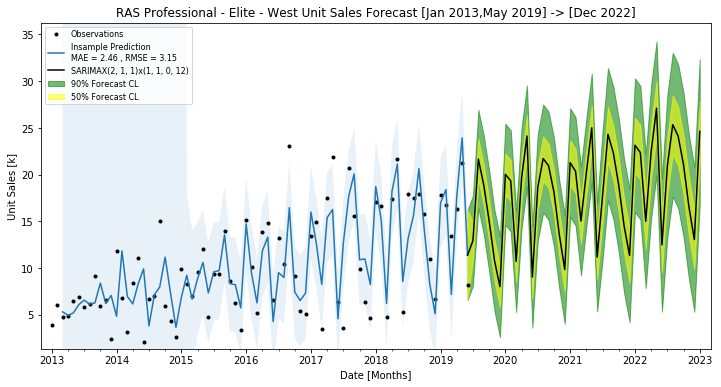

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


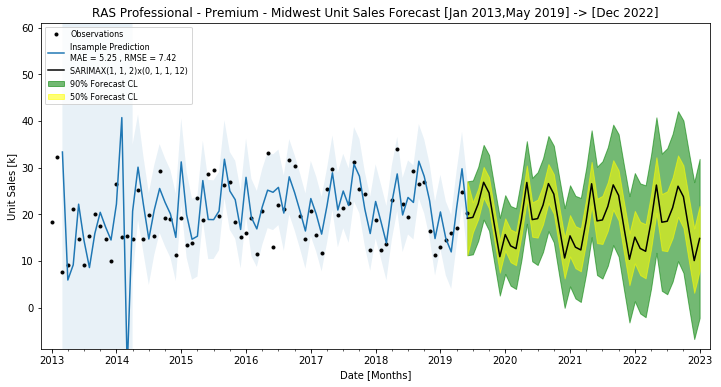

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


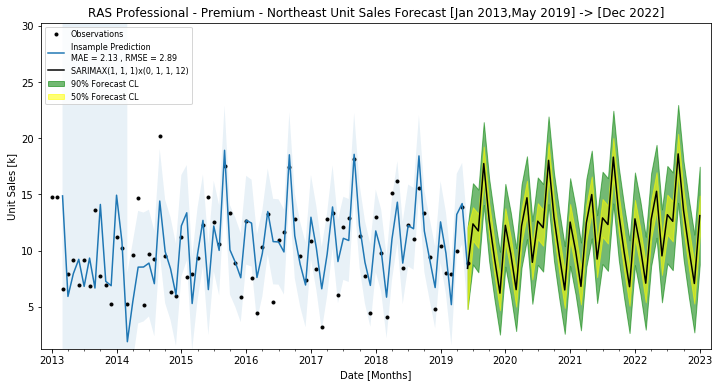

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


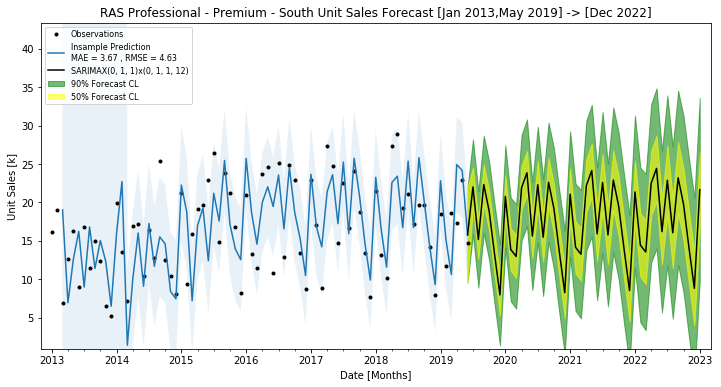

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


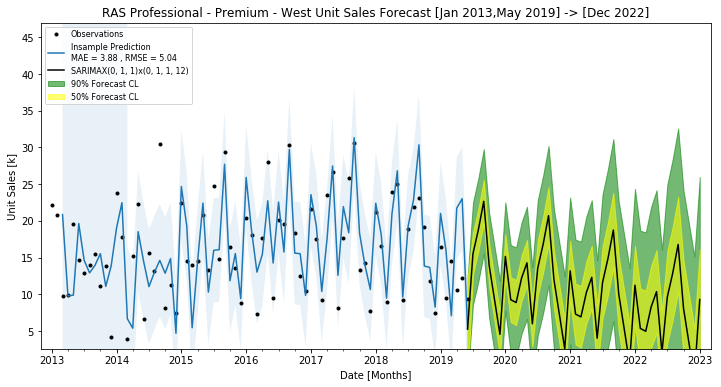

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


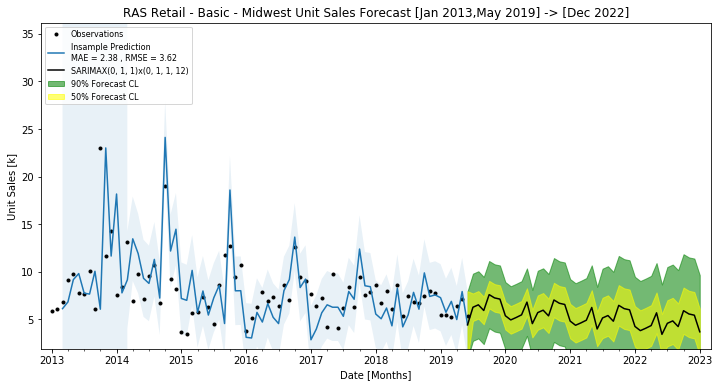

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


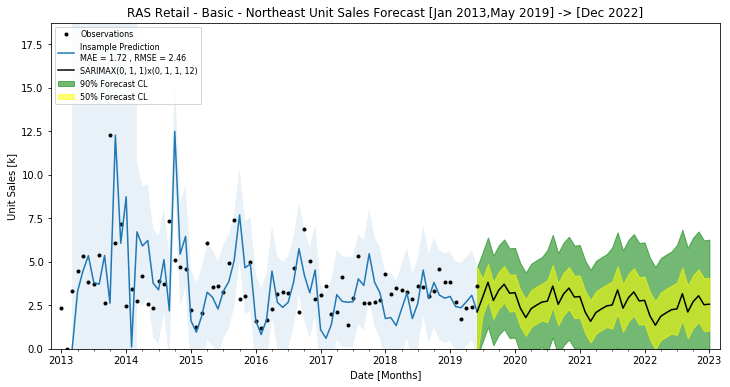

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


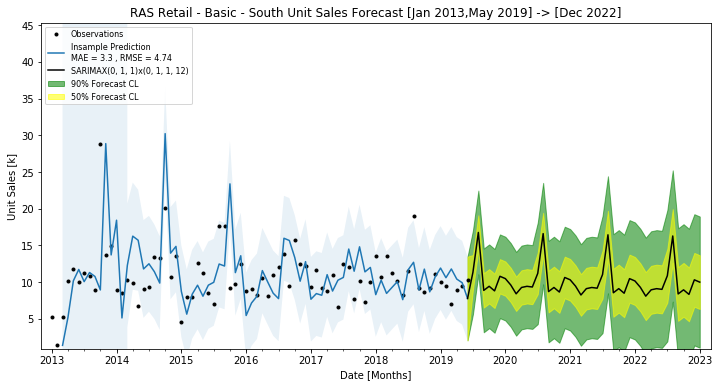

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


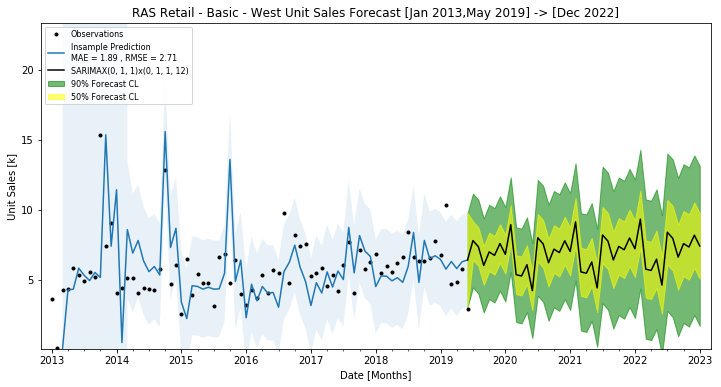

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


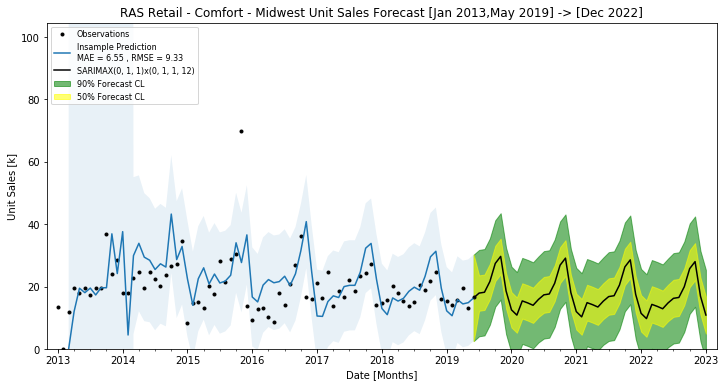

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


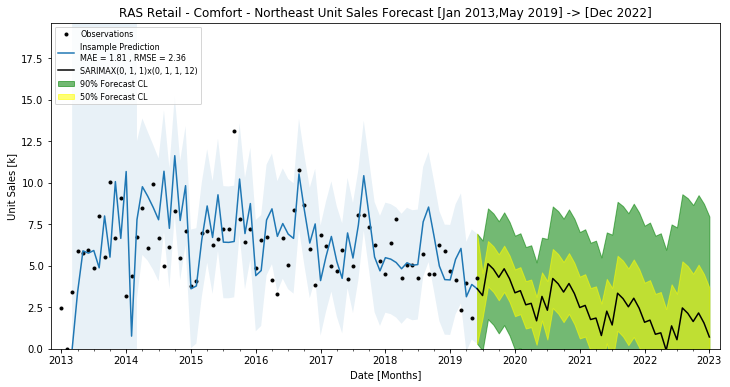

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


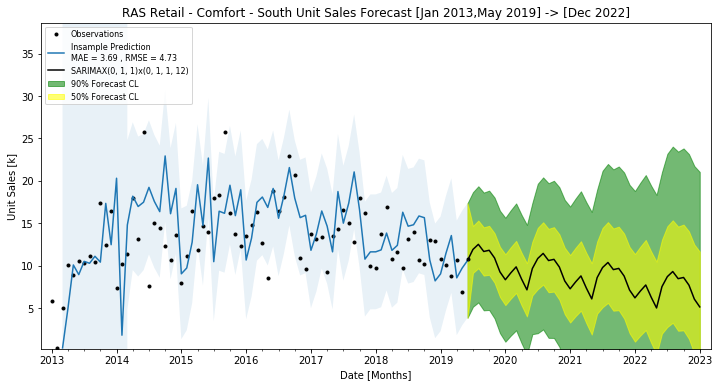

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


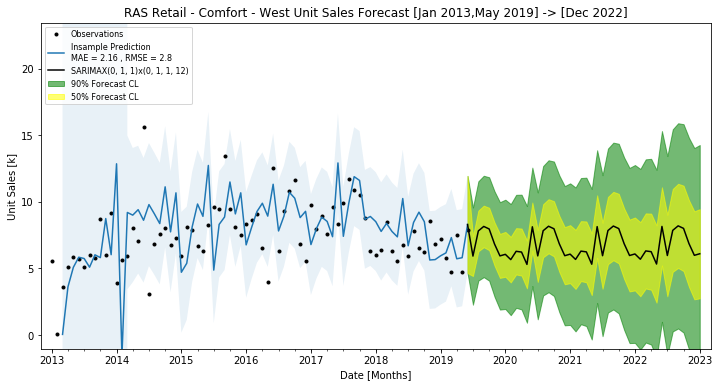

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


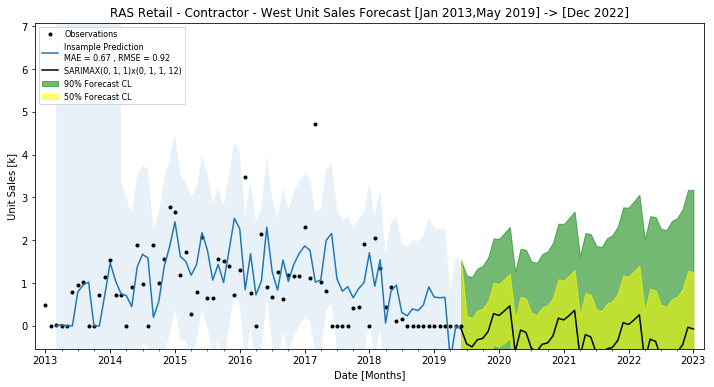

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


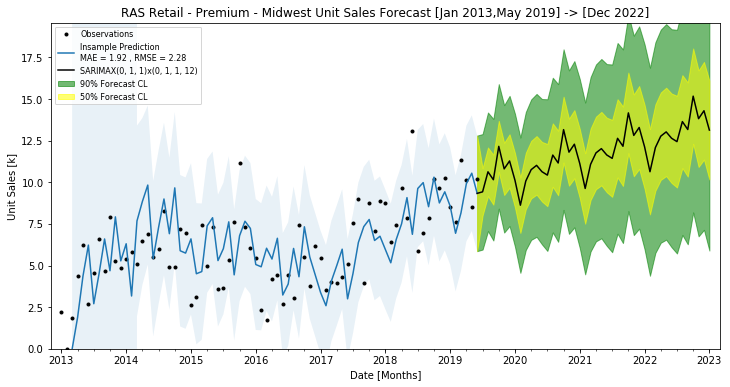

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


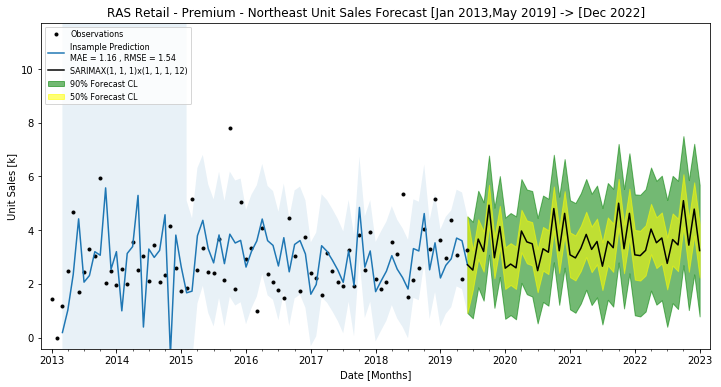

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


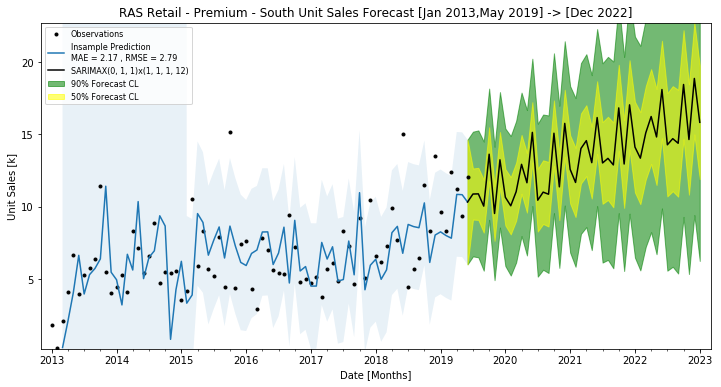

/anaconda3/envs/py37/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:171: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


(12, 6)


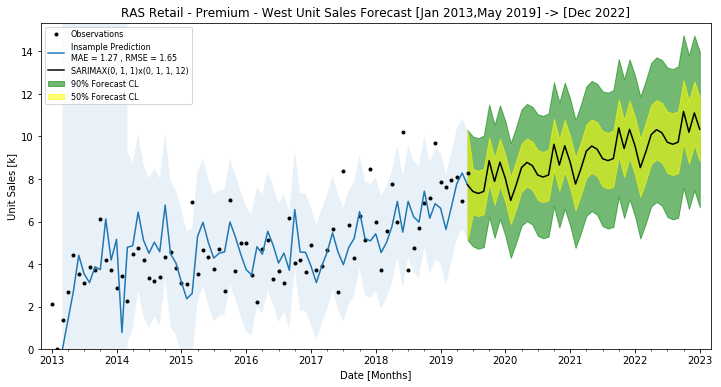

In [57]:
pccatregfullresults = fitSalesData(salesdata)

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2529.107,2131.940,397.167,15.704,NaN,NaN,None
2014,2868.731,3150.902,-282.171,-9.836,11.839,32.339,24.6
2015,2974.226,3035.214,-60.988,-2.051,3.547,-3.812,5.8
2016,2954.154,3087.629,-133.475,-4.518,-0.679,1.698,3.81
2017,3092.653,3138.113,-45.460,-1.470,4.478,1.609,6.23
2018,3279.449,3237.678,41.771,1.274,5.696,3.075,4.69
2019,1549.953,3320.316,NaN,NaN,NaN,2.489,1.25
2020,0.000,3321.797,NaN,NaN,NaN,0.045,0.0446
2021,0.000,3394.483,NaN,NaN,NaN,2.141,2.19
2022,0.000,3470.749,NaN,NaN,NaN,2.197,2.25


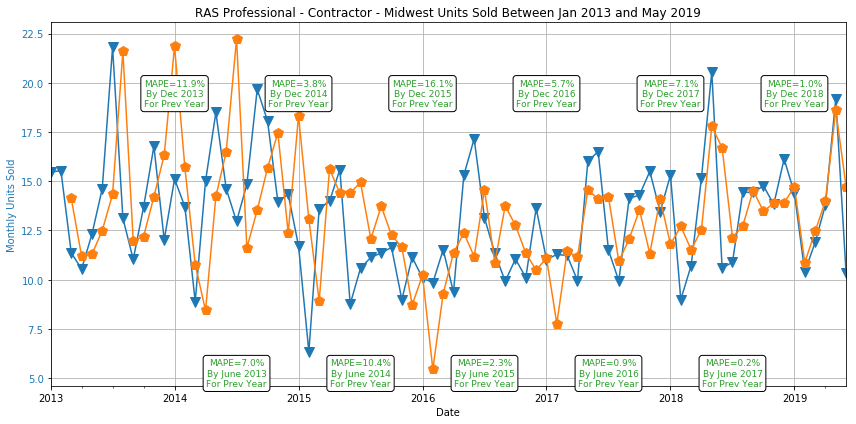

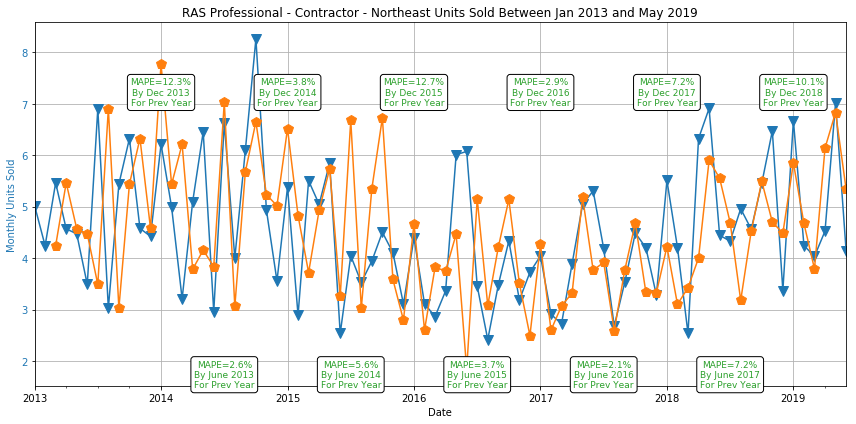

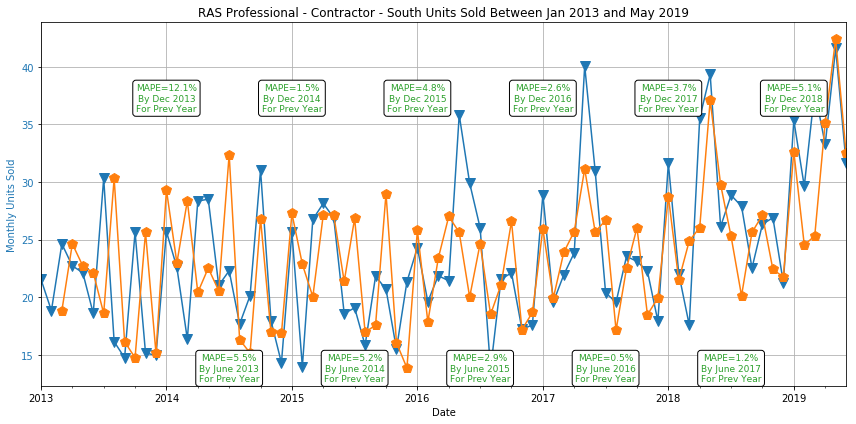

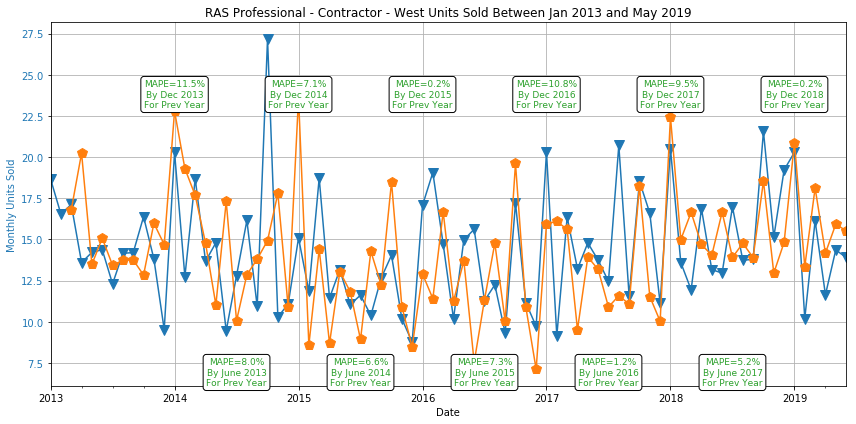

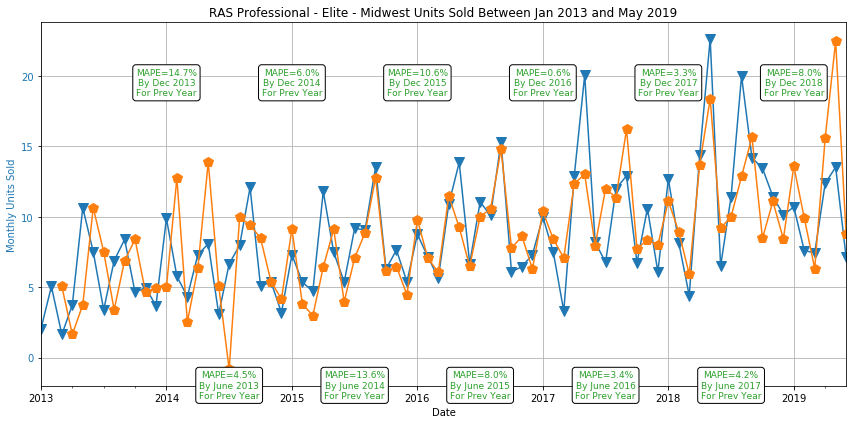

...

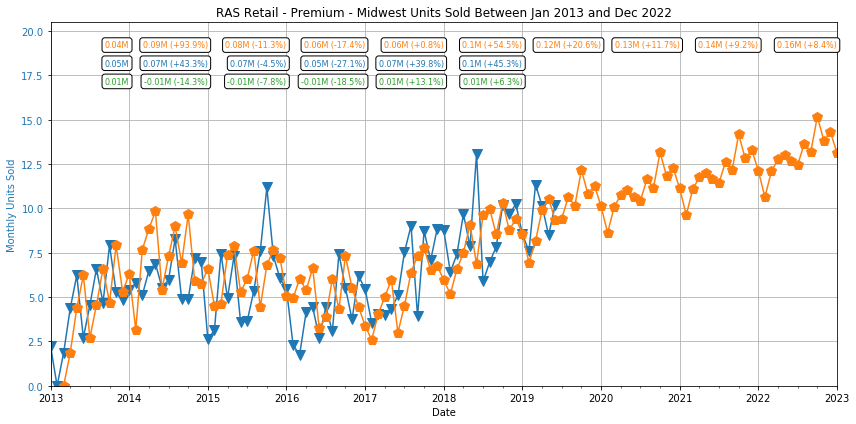

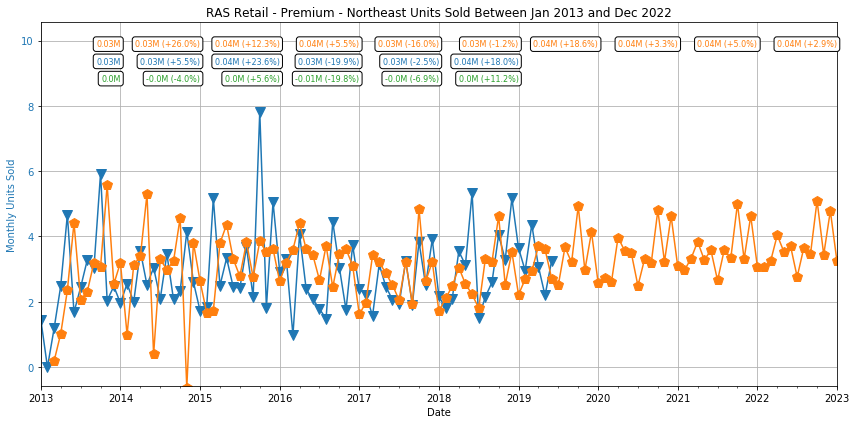

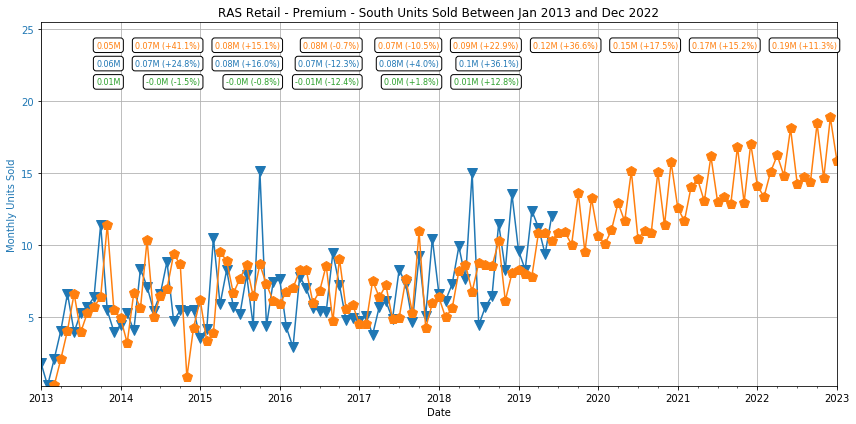

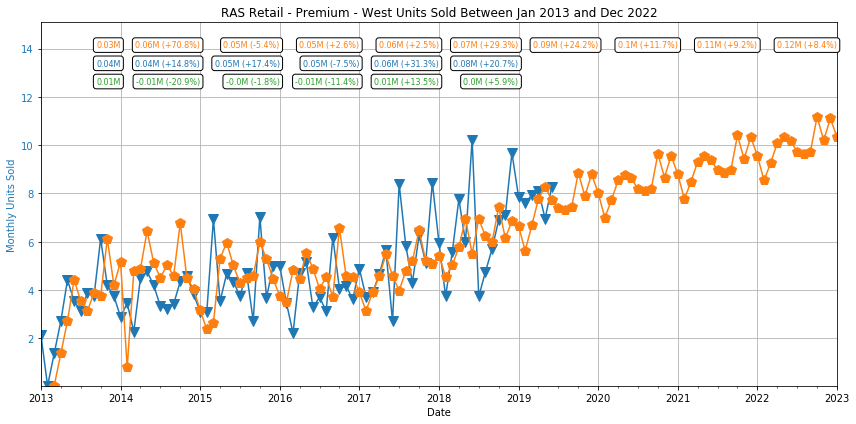

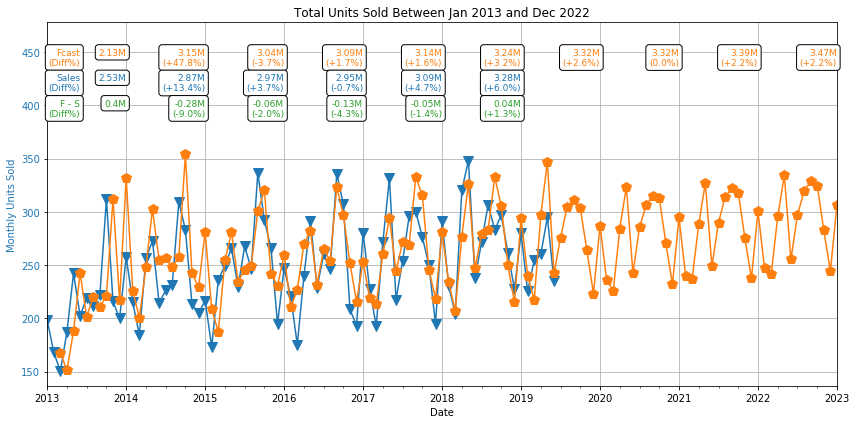

In [58]:
indivMapePlots(pccatregfullresults, startYear)
indivMasterPlots(pccatregfullresults, startYear)
pccatregfullresultsdf = masterPlot(pccatregfullresults, startYear)
pccatregfullresultsdf

# Accuracy Comparison

In [59]:
results = {"Total": totalfullresults, "Category": catfullresults, "Profit Center": pcfullresults, "Region": regfullresults, "PC x Cat": pccatfullresults, "PC x Cat x Reg": pccatregfullresults}

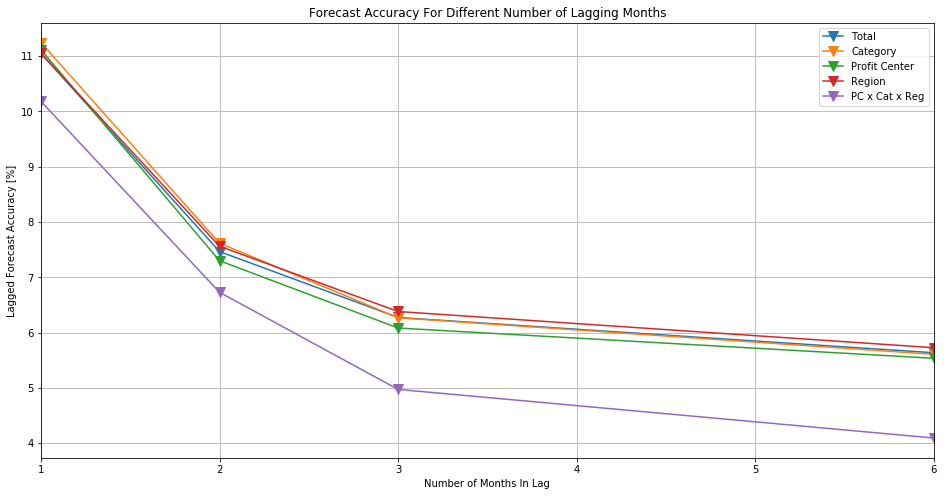

In [60]:
plotResiduals({"Total": combineIndivResults(totalfullresults, 2015),
               "Category": combineIndivResults(catfullresults, 2015),
               "Profit Center": combineIndivResults(pcfullresults, 2015),
               "Region": combineIndivResults(regfullresults, 2015),
               "PC x Cat x Reg": combineIndivResults(pccatregfullresults, 2015)}, size=(16,8))
#plotResiduals(pccatregfullresults, size=(16,8))

# Master Comparison

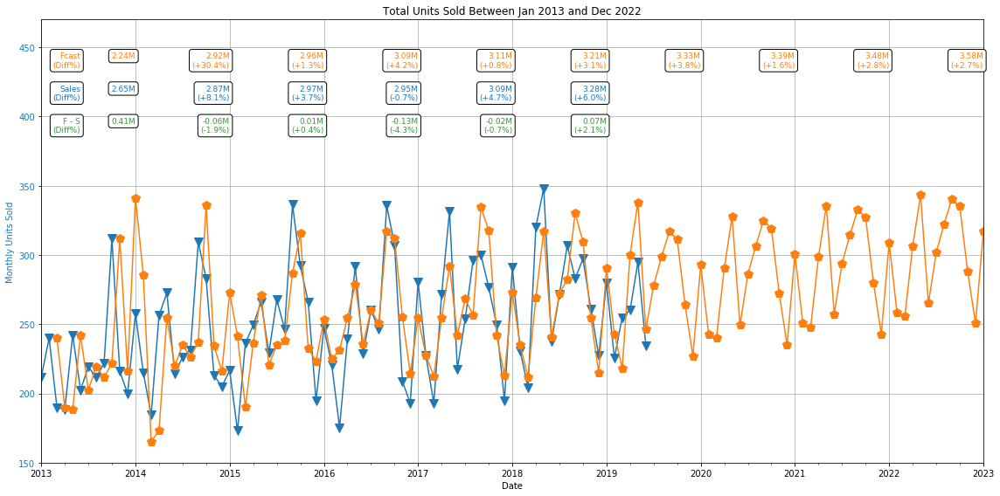

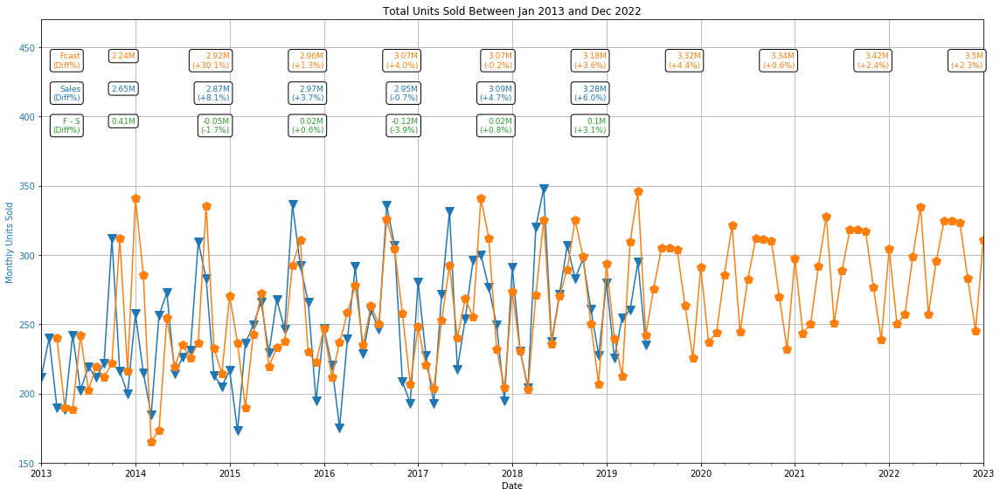

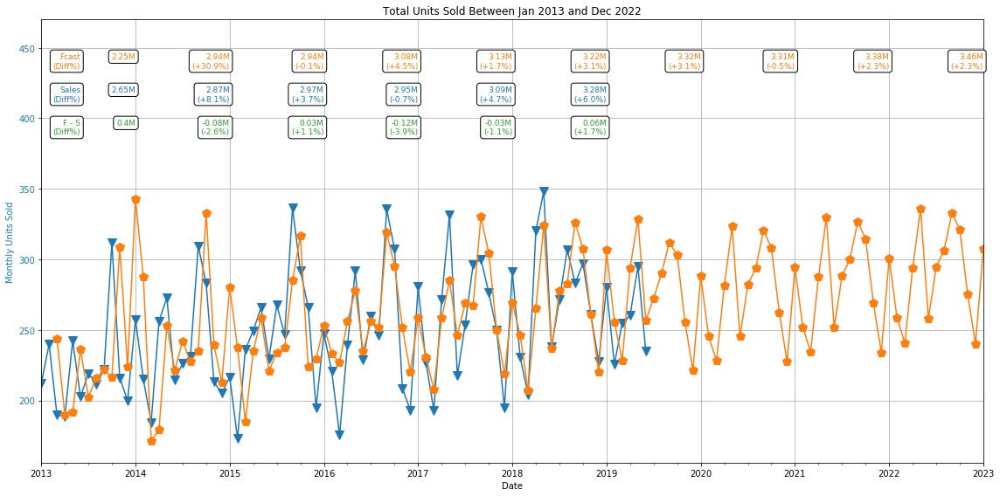

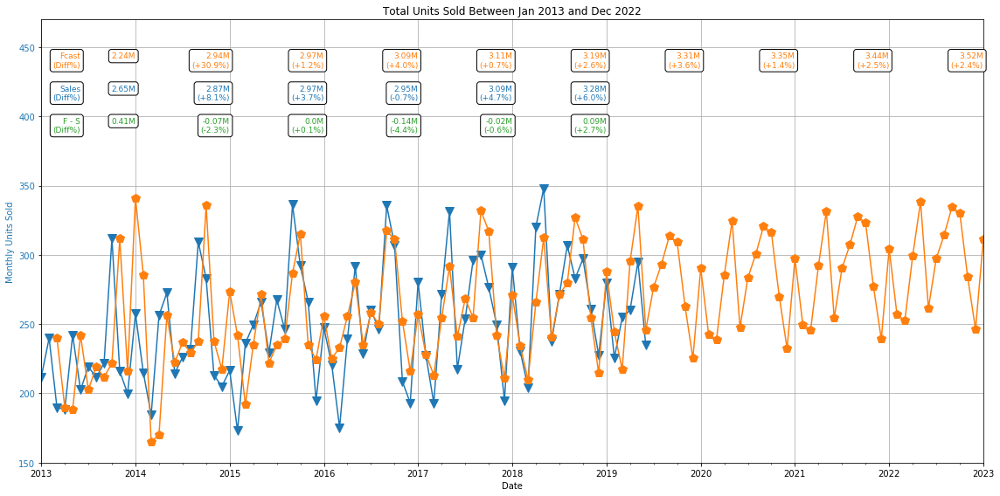

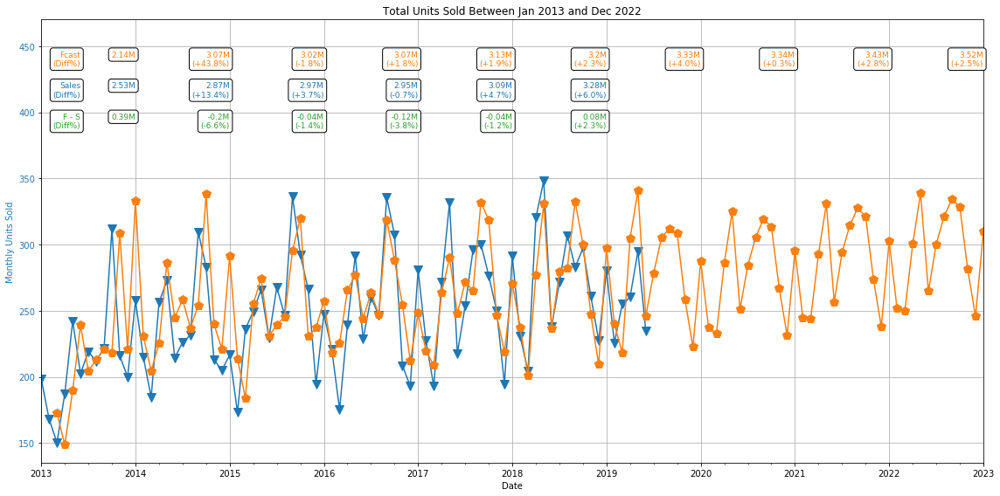

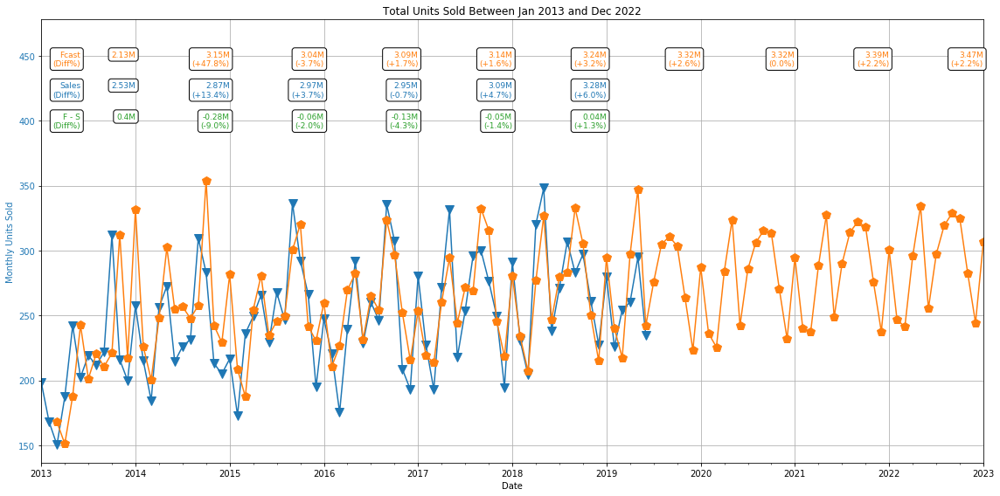

In [61]:
totalfullresultsdf = masterPlot(totalfullresults, startYear, size=(16,8))
pcfullresultsdf = masterPlot(pcfullresults, startYear, size=(16,8))
catfullresultsdf = masterPlot(catfullresults, startYear, size=(16,8))
regfullresultsdf = masterPlot(regfullresults, startYear, size=(16,8))
pccatfullresultsdf = masterPlot(pccatfullresults, startYear, size=(16,8))
pccatregfullresultsdf = masterPlot(pccatregfullresults, startYear, size=(16,8))

In [62]:
startYear = 2013
results = {"Total": totalfullresults, "Category": catfullresults, "Profit Center": pcfullresults, "Region": regfullresults, "PC x Cat": pccatfullresults, "PC x Cat x Reg": pccatregfullresults}
combresults = {}
for k,v in results.items():
    keys = list(v.keys())
    localdata = v[keys[0]]
    for i in range(1,len(keys)):
        localdata = localdata.add(v[keys[i]])
    localresults = localdata[(localdata.index >= to_datetime('{0}-01-01'.format(startYear)))]    
    colname = "Total"

    combresults[k] = localresults

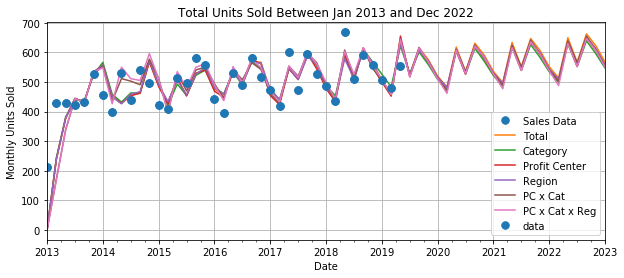

In [63]:

f, ax1 = plt.subplots(1, 1, figsize=(10,4))
truedata = combresults["Total"]['data'].resample('2M').sum()
truedata = truedata[(truedata.index < to_datetime('{0}-07-01'.format(2019)))]
ax1 = truedata.plot(ax=ax1, grid=True, style='.', ms=15, label="Sales Data")
ax1.set_ylabel("Monthly Units Sold")
ax1.set_xlabel("Date")
ax1.tick_params(axis='y')
ax1.set_title("{0} Units Sold Between Jan {1} and Dec 2022".format(colname, startYear))
for tsname, tsdata in combresults.items():
    centdata = tsdata["central"].resample('2M').sum()
    ax1 = centdata.plot(ax=ax1, grid=True, style='-', ms=2, label=tsname)    
    
ax1 = truedata.plot(ax=ax1, grid=True, style='.', ms=15, color='C0', label=None)
ax1.legend(loc='best')

In [64]:
preddata = {}
upperpreddata = {}
lowerpreddata = {}
freq='1M'

truedata = combresults["Total"]['data'].resample(freq).sum()
truedata = truedata[(truedata.index < to_datetime('{0}-07-01'.format(2019)))]
for tsname, tsdata in combresults.items():
    centdata = tsdata["central"].resample(freq).sum()
    lowerdata = tsdata["lower value"].resample(freq).sum()
    upperdata = tsdata["upper value"].resample(freq).sum()
    preddata[tsname] = centdata
    upperpreddata[tsname] = upperdata
    lowerpreddata[tsname] = lowerdata

predregion = {}
predregion["Data"]  = truedata
predregion["Central"] = DataFrame(preddata).mean(axis=1)
predregion["Upper"] = DataFrame(preddata).max(axis=1)
predregion["Lower"] = DataFrame(preddata).min(axis=1)
predregion["FC Upper"] = DataFrame(upperpreddata).max(axis=1)
predregion["FC Lower"] = DataFrame(lowerpreddata).min(axis=1)

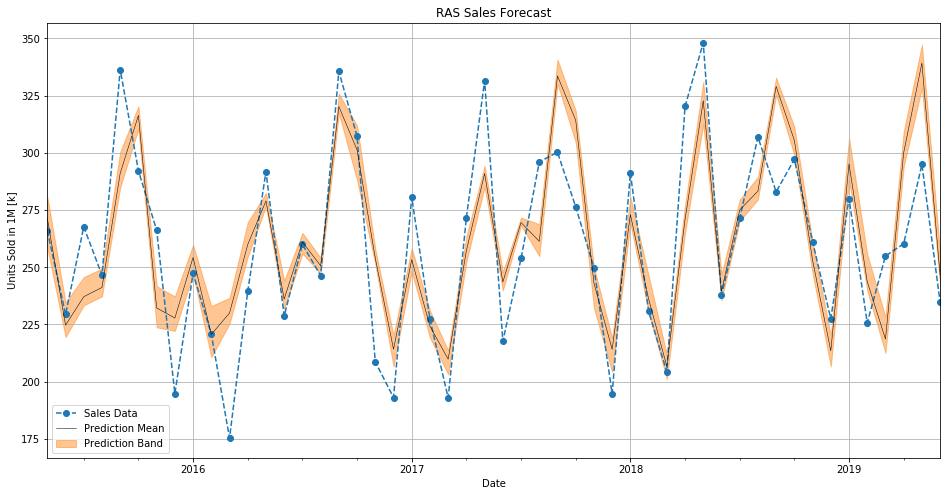

In [65]:
f, ax = plt.subplots(1, 1, figsize=(16,8))
prdf = DataFrame(predregion)
prdf = prdf[(prdf.index < to_datetime('{0}-07-01'.format(2019))) & (prdf.index >= to_datetime('{0}-05-01'.format(startYear+2)))]    
col = 'C1'
ax = prdf["Data"].plot(ax=ax, style='--.', ms=12, label="Sales Data")
ax.set_ylabel("Units Sold in {0} [k]".format(freq))
ax.set_xlabel("Date")
ax.set_title("RAS Sales Forecast")
#ax.tick_params(axis='y', labelcolor=color)
ax.fill_between(prdf.index, prdf["Lower"], prdf["Upper"], alpha=0.45, color=col, label="Prediction Band")
#ax.fill_between(prdf.index, prdf["FC Lower"], prdf["FC Upper"], alpha=0.35, color='C2', label="Prediction Band")
ax = prdf["Central"].plot(ax=ax, grid=True, style='-', lw=0.5, color='black', label="Prediction Mean")
ax.legend(loc='best')

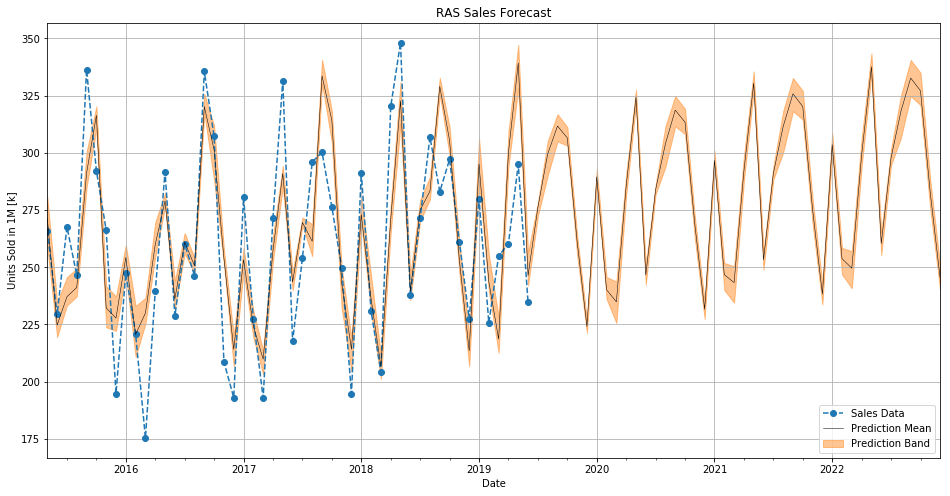

In [66]:
f, ax = plt.subplots(1, 1, figsize=(16,8))
prdf = DataFrame(predregion)
prdf = prdf[(prdf.index < to_datetime('{0}-01-01'.format(2023))) & (prdf.index >= to_datetime('{0}-05-01'.format(startYear+2)))]    
col = 'C1'
ax = prdf["Data"].plot(ax=ax, style='--.', ms=12, label="Sales Data")
ax.set_ylabel("Units Sold in {0} [k]".format(freq))
ax.set_xlabel("Date")
ax.set_title("RAS Sales Forecast")
#ax.tick_params(axis='y', labelcolor=color)
ax.fill_between(prdf.index, prdf["Lower"], prdf["Upper"], alpha=0.45, color=col, label="Prediction Band")
#ax.fill_between(prdf.index, prdf["FC Lower"], prdf["FC Upper"], alpha=0.35, color='C2', label="Prediction Band")
ax = prdf["Central"].plot(ax=ax, grid=True, style='-', lw=0.5, color='black', label="Prediction Mean")
ax.legend(loc='best')

In [67]:
salesgrowth = totalfullresultsdf["Sales (S)"]
salesgrowth[salesgrowth.index >= 2019] = 0
#salesgrowth.index = [x+.5 for x in list(totalfullresultsdf["Growth Sales [%]"].index)]

In [68]:
startYear = 2013
results = {"Total": totalfullresultsdf, "Category": catfullresultsdf, "Profit Center": pcfullresultsdf, "Region": regfullresultsdf, "PC x Cat": pccatfullresultsdf, "PC x Cat x Reg": pccatregfullresultsdf}
results = DataFrame({k: v["Forecast (F)"].copy() for k,v in results.items()})
results = results[results.index >= 2015]

salesgrowth = totalfullresultsdf["Sales (S)"]
salesgrowth = salesgrowth[salesgrowth.index >= 2015]
salesgrowth[salesgrowth.index >= 2019] = None

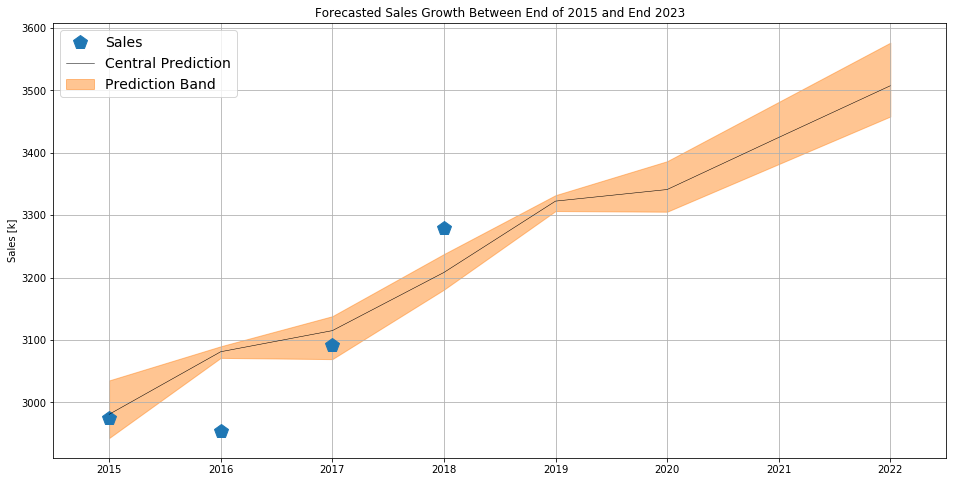

In [69]:
central = results.mean(axis=1)
upper   = results.max(axis=1)
lower   = results.min(axis=1)

f, ax = plt.subplots(1, 1, figsize=(16,8))
salesgrowth.plot(ax=ax, style='p', ms=15, label="Sales")
ax.fill_between(central.index, lower, upper, alpha=0.45, color=col, label="Prediction Band")
central.plot(ax=ax, grid=True, style='-', lw=0.5, color='black', label="Central Prediction")
ax.set_ylabel("Sales [k]")
ax.set_title("Forecasted Sales Growth Between End of 2015 and End 2023")
ax.set_xlim([2014.5, 2022.5])
ax.legend(loc='upper left', fontsize=14)

In [70]:
DataFrame([salesgrowth,central,upper,lower]).T

,Sales (S),Unnamed 0,Unnamed 1,Unnamed 2
2015,2974.226,2980.907,3035.214,2942.925
2016,2954.154,3081.203,3089.897,3071.343
2017,3092.653,3115.002,3138.113,3069.378
2018,3279.449,3208.250,3237.678,3180.681
2019,NaN,3322.535,3332.045,3306.639
2020,NaN,3341.093,3386.443,3305.552
2021,NaN,3424.577,3481.406,3381.854
2022,NaN,3507.376,3576.370,3458.080


In [71]:
totalfullresultsdf

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,2243.215,411.765,15.509,NaN,NaN,None
2014,2868.731,2924.891,-56.160,-1.958,7.451,23.306,10.2
2015,2974.226,2963.327,10.899,0.366,3.547,1.297,3.3
2016,2954.154,3088.267,-134.113,-4.540,-0.679,4.046,3.83
2017,3092.653,3114.201,-21.548,-0.697,4.478,0.833,5.42
2018,3279.449,3210.759,68.690,2.095,5.696,3.007,3.82
2019,0.000,3332.045,NaN,NaN,NaN,3.640,1.6
2020,0.000,3386.443,NaN,NaN,NaN,1.606,1.63
2021,0.000,3481.406,NaN,NaN,NaN,2.728,2.8
2022,0.000,3576.370,NaN,NaN,NaN,2.655,2.73


In [495]:
1.315 * 12 / 5

3.1559999999999997

In [503]:
cent = DataFrame(predregion)['Central']
cent[(cent.index >= '2019-01-01') & (cent.index <= '2019-06-01')].sum()

1398.9901711105517

In [504]:
(1.39-1.31)/1.31

0.061068702290076216

In [505]:
(3.33 - 3.15)/3.15

0.0571428571428572

In [522]:
df = DataFrame(predregion)["Data"]
df = df[df.index <= '2019-01-01']
pre  = 0
post = 0
for i in range(1,13):
    s = df[df.index.month == i].mean()
    if i <= 5:
        pre += s
    else:
        post += s

print((post+pre)/pre)

2.450896388047059


In [520]:
12/5

2.4

In [524]:
post

1758.6121666666666

In [525]:
post/pre

1.4508963880470593

In [527]:
(1.45-1.4)/1.4

0.03571428571428575

In [528]:
1.31*2.45

3.2095000000000002

In [530]:
(3.33-3.21)/3.33

0.03603603603603607